# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

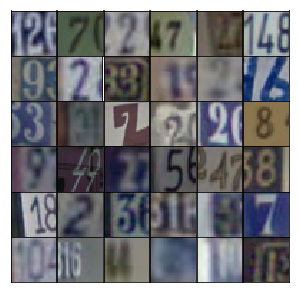

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
# Scale works the same as tanh
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    
    return inputs_real

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [10]:
def generator(inputs, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs, 64, 5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(nl1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(nl2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        # First fully connected layer
        h4 = tf.layers.dense(nl3_vec, 4*4*512)
        # Reshape it to start the convolutional stack
        h4_mat = tf.reshape(h4, (-1, 4, 4, 512))
        bn4 = tf.layers.batch_normalization(h4_mat, training=training)
        nl4 = tf.maximum(alpha * bn4, bn4)
        # 4x4x512 now
        
        h5 = tf.layers.conv2d_transpose(nl4, 256, 5, strides=2, padding='same')
        bn5 = tf.layers.batch_normalization(h5, training=training)
        nl5 = tf.maximum(alpha * bn5, bn5)
        # 8x8x256 now
        
        h6 = tf.layers.conv2d_transpose(nl5, 128, 5, strides=2, padding='same')
        bn6 = tf.layers.batch_normalization(h6, training=training)
        nl6 = tf.maximum(alpha * bn6, bn6)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(nl6, output_dim, 5, strides=2, padding='same')        
        predictions = tf.tanh(logits)
        # 32x32x3 now

        # generated input or input fake
        return predictions

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [11]:
def discriminator(inputs, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs, 64, 5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=True)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(nl1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=True)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(nl2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=True)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        # predictions = tf.sigmoid(logits)
        
        # rewards for the loss and opt
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [12]:
def model_loss(inputs_real, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    inputs_fake = generator(inputs=inputs_real, output_dim=output_dim, alpha=alpha)
    d_logits_fake = discriminator(inputs=inputs_fake, alpha=alpha)
    d_logits_real = discriminator(inputs=inputs_real, alpha=alpha, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss_reward = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    g_loss_reconst = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=inputs_fake, labels=tf.sigmoid(inputs_real)))
    # g_loss_reconst = tf.reduce_mean(tf.losses.mean_squared_error(predictions=input_fake, labels=input_real))

    return d_loss, g_loss_reward, g_loss_reconst

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [13]:
def model_opt(d_loss, g_loss_reward, g_loss_reconst, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss_reward: Generator loss Tensor reward
    :param g_loss_reconst: Generator loss Tensor reconstruction
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt_reward = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss_reward, 
                                                                                         var_list=g_vars)
        g_train_opt_reconst = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss_reconst, 
                                                                                          var_list=g_vars)

    return d_train_opt, g_train_opt_reward, g_train_opt_reconst

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [15]:
class GAN:
    def __init__(self, real_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.inputs_real = model_inputs(real_dim=real_size)
        
        self.d_loss, self.g_loss_reward, self.g_loss_reconst = model_loss(inputs_real=self.inputs_real, 
                                                                          output_dim=real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt_reward, self.g_opt_reconst = model_opt(d_loss=self.d_loss, 
                                                                      g_loss_reward=self.g_loss_reward, 
                                                                      g_loss_reconst=self.g_loss_reconst, 
                                                                      learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [16]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [22]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    # Creating a session for training
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver.restore(sess, './checkpoints/auto-dcgan-2.ckpt')
        
        # Number of epochs for updating the model/s
        for e in range(epochs):
            
            # Training batches
            for x, _ in dataset.batches(batch_size):
                steps += 1

                # Run optimizers
                feed_dict={net.inputs_real: x}
                _ = sess.run(net.d_opt, feed_dict)
                _ = sess.run(net.g_opt_reward, feed_dict)
                _ = sess.run(net.g_opt_reconst, feed_dict)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval(feed_dict)
                    train_loss_g_reward = net.g_loss_reward.eval(feed_dict)
                    train_loss_g_reconst = net.g_loss_reconst.eval(feed_dict)

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator reward Loss: {:.4f}...".format(train_loss_g_reward),
                          "Generator reconst Loss: {:.4f}".format(train_loss_g_reconst))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g_reward, train_loss_g_reconst))

                if steps % show_every == 0:
                    fetches = generator(inputs=net.inputs_real, output_dim=3, reuse=True, training=False)
                    gen_samples = sess.run(fetches, feed_dict)
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/auto-dcgan-2.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [28]:
real_size = (32,32,3)
learning_rate = 0.0002
batch_size = 128
epochs = 1
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size=real_size, learning_rate=learning_rate, alpha=alpha, beta1=beta1)

INFO:tensorflow:Restoring parameters from ./checkpoints/auto-dcgan-2.ckpt
Epoch 1/10... Discriminator Loss: 1.3670... Generator reward Loss: 0.6881... Generator reconst Loss: 0.6751
Epoch 1/10... Discriminator Loss: 1.3184... Generator reward Loss: 0.7602... Generator reconst Loss: 0.6723
Epoch 1/10... Discriminator Loss: 1.4371... Generator reward Loss: 0.6502... Generator reconst Loss: 0.6746
Epoch 1/10... Discriminator Loss: 1.3798... Generator reward Loss: 0.6727... Generator reconst Loss: 0.6757
Epoch 1/10... Discriminator Loss: 1.2950... Generator reward Loss: 0.6914... Generator reconst Loss: 0.6749
Epoch 1/10... Discriminator Loss: 1.4123... Generator reward Loss: 0.6794... Generator reconst Loss: 0.6735
Epoch 1/10... Discriminator Loss: 1.3606... Generator reward Loss: 0.7433... Generator reconst Loss: 0.6736
Epoch 1/10... Discriminator Loss: 1.2836... Generator reward Loss: 0.7617... Generator reconst Loss: 0.6738
Epoch 1/10... Discriminator Loss: 1.3796... Generator reward L

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


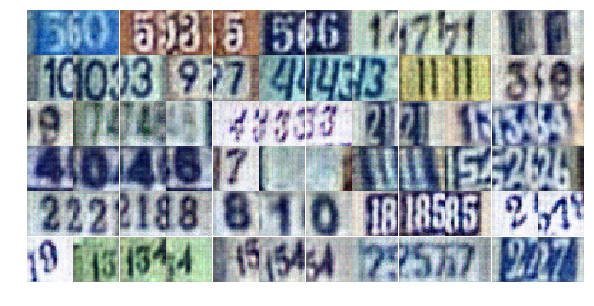

Epoch 1/10... Discriminator Loss: 1.3123... Generator reward Loss: 0.7183... Generator reconst Loss: 0.6730
Epoch 1/10... Discriminator Loss: 1.3271... Generator reward Loss: 0.7843... Generator reconst Loss: 0.6770
Epoch 1/10... Discriminator Loss: 1.4059... Generator reward Loss: 0.6670... Generator reconst Loss: 0.6739
Epoch 1/10... Discriminator Loss: 1.2682... Generator reward Loss: 0.7146... Generator reconst Loss: 0.6782
Epoch 1/10... Discriminator Loss: 1.2339... Generator reward Loss: 1.0240... Generator reconst Loss: 0.6751
Epoch 1/10... Discriminator Loss: 1.2966... Generator reward Loss: 0.7825... Generator reconst Loss: 0.6745
Epoch 1/10... Discriminator Loss: 1.4632... Generator reward Loss: 0.5971... Generator reconst Loss: 0.6767
Epoch 1/10... Discriminator Loss: 1.4050... Generator reward Loss: 0.6071... Generator reconst Loss: 0.6753
Epoch 1/10... Discriminator Loss: 1.2728... Generator reward Loss: 0.7630... Generator reconst Loss: 0.6731
Epoch 1/10... Discriminator 

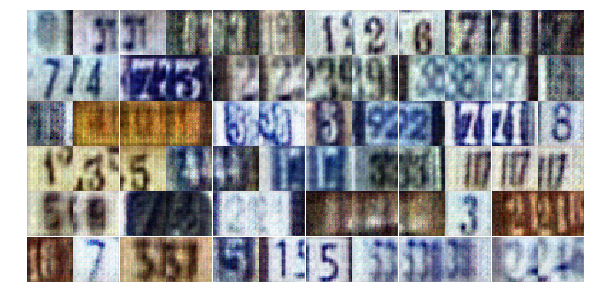

Epoch 1/10... Discriminator Loss: 1.4377... Generator reward Loss: 0.6270... Generator reconst Loss: 0.6720
Epoch 1/10... Discriminator Loss: 1.2659... Generator reward Loss: 0.8213... Generator reconst Loss: 0.6757
Epoch 1/10... Discriminator Loss: 1.2304... Generator reward Loss: 0.8778... Generator reconst Loss: 0.6773
Epoch 1/10... Discriminator Loss: 1.5308... Generator reward Loss: 0.6263... Generator reconst Loss: 0.6748
Epoch 1/10... Discriminator Loss: 1.3293... Generator reward Loss: 0.7131... Generator reconst Loss: 0.6766
Epoch 1/10... Discriminator Loss: 1.2939... Generator reward Loss: 0.8173... Generator reconst Loss: 0.6728
Epoch 1/10... Discriminator Loss: 1.4121... Generator reward Loss: 0.6899... Generator reconst Loss: 0.6740
Epoch 1/10... Discriminator Loss: 1.4081... Generator reward Loss: 0.7104... Generator reconst Loss: 0.6724
Epoch 1/10... Discriminator Loss: 1.3029... Generator reward Loss: 0.7896... Generator reconst Loss: 0.6765
Epoch 1/10... Discriminator 

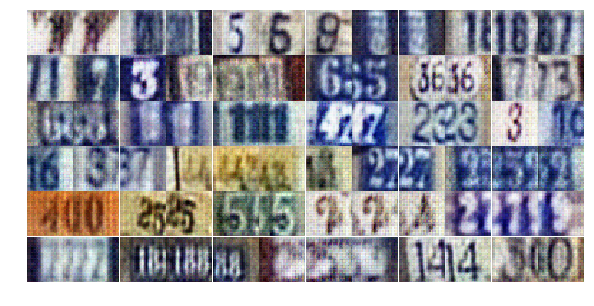

Epoch 1/10... Discriminator Loss: 1.2237... Generator reward Loss: 0.9676... Generator reconst Loss: 0.6734
Epoch 1/10... Discriminator Loss: 1.3891... Generator reward Loss: 0.6148... Generator reconst Loss: 0.6745
Epoch 1/10... Discriminator Loss: 1.3470... Generator reward Loss: 0.7406... Generator reconst Loss: 0.6743
Epoch 1/10... Discriminator Loss: 1.2396... Generator reward Loss: 0.7795... Generator reconst Loss: 0.6784
Epoch 1/10... Discriminator Loss: 1.3162... Generator reward Loss: 0.7543... Generator reconst Loss: 0.6775
Epoch 1/10... Discriminator Loss: 1.3695... Generator reward Loss: 0.7592... Generator reconst Loss: 0.6761
Epoch 1/10... Discriminator Loss: 1.3371... Generator reward Loss: 0.7420... Generator reconst Loss: 0.6751
Epoch 1/10... Discriminator Loss: 1.2480... Generator reward Loss: 0.8753... Generator reconst Loss: 0.6773
Epoch 1/10... Discriminator Loss: 1.3352... Generator reward Loss: 0.8353... Generator reconst Loss: 0.6739
Epoch 1/10... Discriminator 

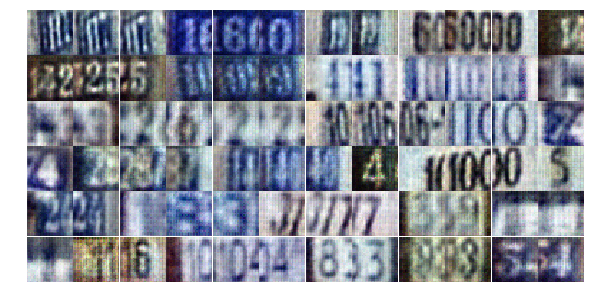

Epoch 1/10... Discriminator Loss: 1.3701... Generator reward Loss: 0.7082... Generator reconst Loss: 0.6733
Epoch 1/10... Discriminator Loss: 1.4502... Generator reward Loss: 0.6657... Generator reconst Loss: 0.6757
Epoch 1/10... Discriminator Loss: 1.3685... Generator reward Loss: 0.6422... Generator reconst Loss: 0.6739
Epoch 1/10... Discriminator Loss: 1.3264... Generator reward Loss: 0.8362... Generator reconst Loss: 0.6729
Epoch 1/10... Discriminator Loss: 1.3778... Generator reward Loss: 0.6843... Generator reconst Loss: 0.6721
Epoch 1/10... Discriminator Loss: 1.3651... Generator reward Loss: 0.7559... Generator reconst Loss: 0.6703
Epoch 1/10... Discriminator Loss: 1.3604... Generator reward Loss: 0.7546... Generator reconst Loss: 0.6748
Epoch 1/10... Discriminator Loss: 1.3246... Generator reward Loss: 0.7310... Generator reconst Loss: 0.6734
Epoch 1/10... Discriminator Loss: 1.3589... Generator reward Loss: 0.6377... Generator reconst Loss: 0.6752
Epoch 1/10... Discriminator 

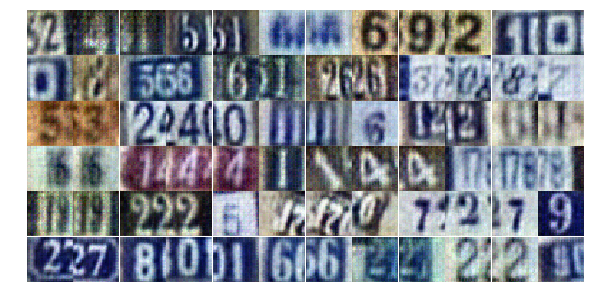

Epoch 1/10... Discriminator Loss: 1.3494... Generator reward Loss: 0.6901... Generator reconst Loss: 0.6728
Epoch 1/10... Discriminator Loss: 1.4212... Generator reward Loss: 0.7010... Generator reconst Loss: 0.6751
Epoch 1/10... Discriminator Loss: 1.3728... Generator reward Loss: 0.6539... Generator reconst Loss: 0.6736
Epoch 1/10... Discriminator Loss: 1.3548... Generator reward Loss: 0.7966... Generator reconst Loss: 0.6745
Epoch 1/10... Discriminator Loss: 1.3839... Generator reward Loss: 0.7290... Generator reconst Loss: 0.6761
Epoch 1/10... Discriminator Loss: 1.4235... Generator reward Loss: 0.5733... Generator reconst Loss: 0.6746
Epoch 1/10... Discriminator Loss: 1.4256... Generator reward Loss: 0.7663... Generator reconst Loss: 0.6743
Epoch 2/10... Discriminator Loss: 1.3450... Generator reward Loss: 0.7254... Generator reconst Loss: 0.6727
Epoch 2/10... Discriminator Loss: 1.3126... Generator reward Loss: 0.7461... Generator reconst Loss: 0.6782
Epoch 2/10... Discriminator 

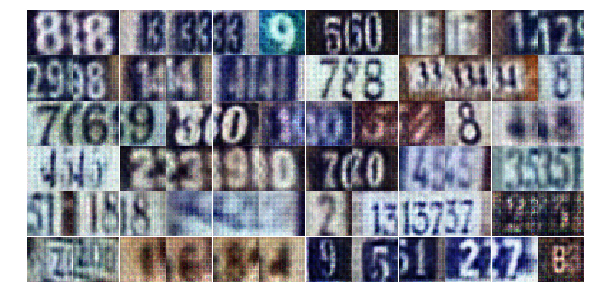

Epoch 2/10... Discriminator Loss: 1.3944... Generator reward Loss: 0.6780... Generator reconst Loss: 0.6734
Epoch 2/10... Discriminator Loss: 1.3220... Generator reward Loss: 0.8020... Generator reconst Loss: 0.6764
Epoch 2/10... Discriminator Loss: 1.2885... Generator reward Loss: 0.6296... Generator reconst Loss: 0.6740
Epoch 2/10... Discriminator Loss: 1.3435... Generator reward Loss: 0.7135... Generator reconst Loss: 0.6767
Epoch 2/10... Discriminator Loss: 1.4090... Generator reward Loss: 0.6299... Generator reconst Loss: 0.6743
Epoch 2/10... Discriminator Loss: 1.3704... Generator reward Loss: 0.6734... Generator reconst Loss: 0.6768
Epoch 2/10... Discriminator Loss: 1.3858... Generator reward Loss: 0.6453... Generator reconst Loss: 0.6733
Epoch 2/10... Discriminator Loss: 1.3239... Generator reward Loss: 0.6843... Generator reconst Loss: 0.6687
Epoch 2/10... Discriminator Loss: 1.4058... Generator reward Loss: 0.6879... Generator reconst Loss: 0.6750
Epoch 2/10... Discriminator 

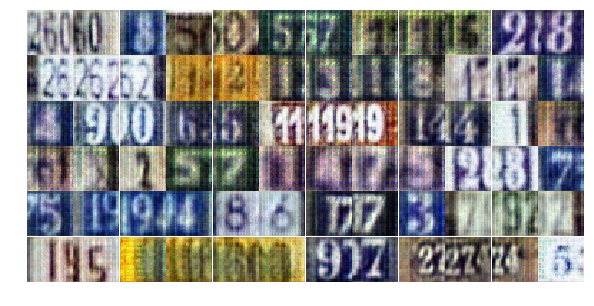

Epoch 2/10... Discriminator Loss: 1.3917... Generator reward Loss: 0.8034... Generator reconst Loss: 0.6716
Epoch 2/10... Discriminator Loss: 1.3610... Generator reward Loss: 0.7682... Generator reconst Loss: 0.6751
Epoch 2/10... Discriminator Loss: 1.3524... Generator reward Loss: 0.7433... Generator reconst Loss: 0.6762
Epoch 2/10... Discriminator Loss: 1.4043... Generator reward Loss: 0.6341... Generator reconst Loss: 0.6775
Epoch 2/10... Discriminator Loss: 1.2714... Generator reward Loss: 0.7192... Generator reconst Loss: 0.6744
Epoch 2/10... Discriminator Loss: 1.2516... Generator reward Loss: 0.9486... Generator reconst Loss: 0.6747
Epoch 2/10... Discriminator Loss: 1.3434... Generator reward Loss: 0.7665... Generator reconst Loss: 0.6736
Epoch 2/10... Discriminator Loss: 1.3342... Generator reward Loss: 0.7978... Generator reconst Loss: 0.6731
Epoch 2/10... Discriminator Loss: 1.3359... Generator reward Loss: 0.7280... Generator reconst Loss: 0.6733
Epoch 2/10... Discriminator 

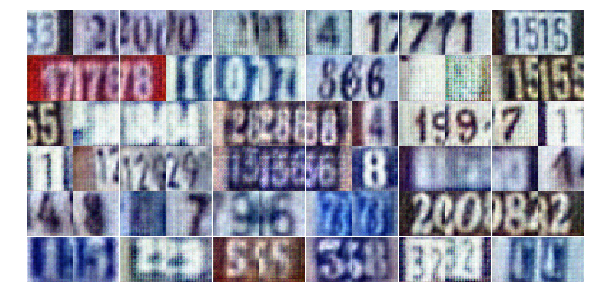

Epoch 2/10... Discriminator Loss: 1.3655... Generator reward Loss: 0.8269... Generator reconst Loss: 0.6723
Epoch 2/10... Discriminator Loss: 1.3252... Generator reward Loss: 0.7212... Generator reconst Loss: 0.6748
Epoch 2/10... Discriminator Loss: 1.3284... Generator reward Loss: 0.7696... Generator reconst Loss: 0.6762
Epoch 2/10... Discriminator Loss: 1.3701... Generator reward Loss: 0.6661... Generator reconst Loss: 0.6763
Epoch 2/10... Discriminator Loss: 1.2853... Generator reward Loss: 0.8052... Generator reconst Loss: 0.6766
Epoch 2/10... Discriminator Loss: 1.2161... Generator reward Loss: 0.8976... Generator reconst Loss: 0.6776
Epoch 2/10... Discriminator Loss: 1.3398... Generator reward Loss: 0.7422... Generator reconst Loss: 0.6763
Epoch 2/10... Discriminator Loss: 1.3879... Generator reward Loss: 0.7482... Generator reconst Loss: 0.6709
Epoch 2/10... Discriminator Loss: 1.3745... Generator reward Loss: 0.6670... Generator reconst Loss: 0.6746
Epoch 2/10... Discriminator 

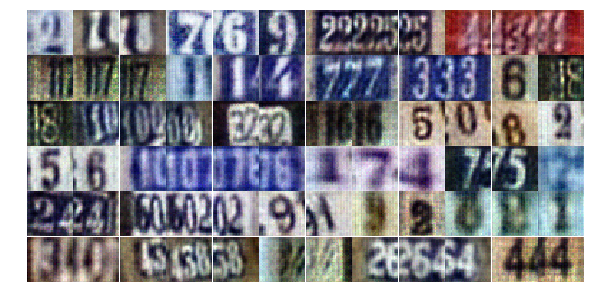

Epoch 2/10... Discriminator Loss: 1.3932... Generator reward Loss: 0.6372... Generator reconst Loss: 0.6697
Epoch 2/10... Discriminator Loss: 1.4198... Generator reward Loss: 0.6815... Generator reconst Loss: 0.6756
Epoch 2/10... Discriminator Loss: 1.3738... Generator reward Loss: 0.6824... Generator reconst Loss: 0.6777
Epoch 2/10... Discriminator Loss: 1.3242... Generator reward Loss: 0.7345... Generator reconst Loss: 0.6783
Epoch 2/10... Discriminator Loss: 1.3537... Generator reward Loss: 0.8004... Generator reconst Loss: 0.6754
Epoch 2/10... Discriminator Loss: 1.3752... Generator reward Loss: 0.7378... Generator reconst Loss: 0.6754
Epoch 2/10... Discriminator Loss: 1.2918... Generator reward Loss: 0.7768... Generator reconst Loss: 0.6738
Epoch 2/10... Discriminator Loss: 1.3348... Generator reward Loss: 0.6824... Generator reconst Loss: 0.6767
Epoch 2/10... Discriminator Loss: 1.3218... Generator reward Loss: 0.7091... Generator reconst Loss: 0.6728
Epoch 2/10... Discriminator 

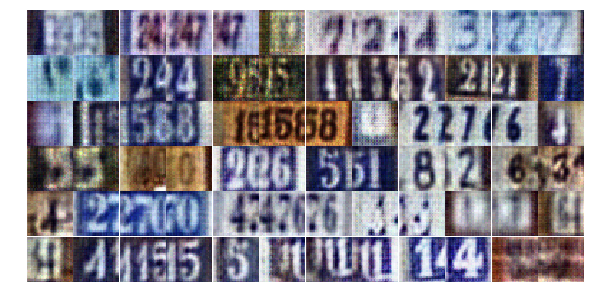

Epoch 2/10... Discriminator Loss: 1.3552... Generator reward Loss: 0.7585... Generator reconst Loss: 0.6756
Epoch 2/10... Discriminator Loss: 1.3247... Generator reward Loss: 0.7472... Generator reconst Loss: 0.6744
Epoch 2/10... Discriminator Loss: 1.3604... Generator reward Loss: 0.6791... Generator reconst Loss: 0.6751
Epoch 2/10... Discriminator Loss: 1.3329... Generator reward Loss: 0.7342... Generator reconst Loss: 0.6734
Epoch 2/10... Discriminator Loss: 1.3819... Generator reward Loss: 0.7034... Generator reconst Loss: 0.6731
Epoch 2/10... Discriminator Loss: 1.3774... Generator reward Loss: 0.6474... Generator reconst Loss: 0.6701
Epoch 2/10... Discriminator Loss: 1.3422... Generator reward Loss: 0.7751... Generator reconst Loss: 0.6747
Epoch 2/10... Discriminator Loss: 1.3496... Generator reward Loss: 0.6381... Generator reconst Loss: 0.6746
Epoch 2/10... Discriminator Loss: 1.3299... Generator reward Loss: 0.6863... Generator reconst Loss: 0.6734
Epoch 2/10... Discriminator 

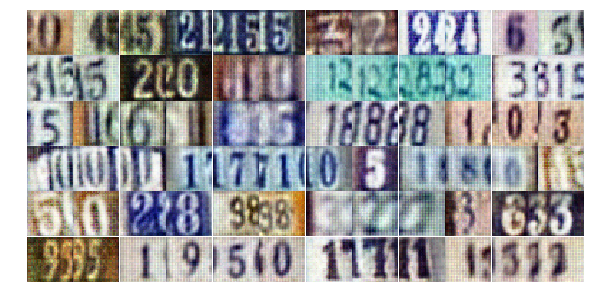

Epoch 2/10... Discriminator Loss: 1.4278... Generator reward Loss: 0.7215... Generator reconst Loss: 0.6748
Epoch 2/10... Discriminator Loss: 1.3670... Generator reward Loss: 0.6936... Generator reconst Loss: 0.6764
Epoch 2/10... Discriminator Loss: 1.3119... Generator reward Loss: 0.7604... Generator reconst Loss: 0.6724
Epoch 2/10... Discriminator Loss: 1.3758... Generator reward Loss: 0.6426... Generator reconst Loss: 0.6771
Epoch 3/10... Discriminator Loss: 1.2850... Generator reward Loss: 0.8986... Generator reconst Loss: 0.6765
Epoch 3/10... Discriminator Loss: 1.3330... Generator reward Loss: 0.7600... Generator reconst Loss: 0.6729
Epoch 3/10... Discriminator Loss: 1.4015... Generator reward Loss: 0.6376... Generator reconst Loss: 0.6733
Epoch 3/10... Discriminator Loss: 1.3232... Generator reward Loss: 0.7023... Generator reconst Loss: 0.6732
Epoch 3/10... Discriminator Loss: 1.3443... Generator reward Loss: 0.7251... Generator reconst Loss: 0.6736
Epoch 3/10... Discriminator 

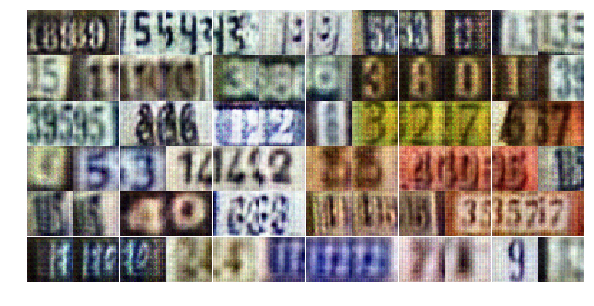

Epoch 3/10... Discriminator Loss: 1.4641... Generator reward Loss: 0.6157... Generator reconst Loss: 0.6745
Epoch 3/10... Discriminator Loss: 1.3781... Generator reward Loss: 0.7384... Generator reconst Loss: 0.6770
Epoch 3/10... Discriminator Loss: 1.3374... Generator reward Loss: 0.7288... Generator reconst Loss: 0.6726
Epoch 3/10... Discriminator Loss: 1.3691... Generator reward Loss: 0.6979... Generator reconst Loss: 0.6733
Epoch 3/10... Discriminator Loss: 1.3556... Generator reward Loss: 0.7140... Generator reconst Loss: 0.6716
Epoch 3/10... Discriminator Loss: 1.3566... Generator reward Loss: 0.6615... Generator reconst Loss: 0.6756
Epoch 3/10... Discriminator Loss: 1.3271... Generator reward Loss: 0.7268... Generator reconst Loss: 0.6766
Epoch 3/10... Discriminator Loss: 1.3388... Generator reward Loss: 0.8144... Generator reconst Loss: 0.6730
Epoch 3/10... Discriminator Loss: 1.3402... Generator reward Loss: 0.6254... Generator reconst Loss: 0.6746
Epoch 3/10... Discriminator 

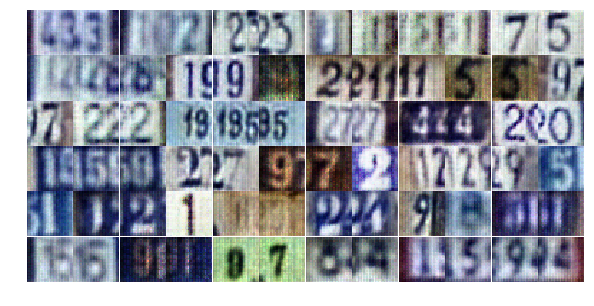

Epoch 3/10... Discriminator Loss: 1.3373... Generator reward Loss: 0.7852... Generator reconst Loss: 0.6755
Epoch 3/10... Discriminator Loss: 1.3735... Generator reward Loss: 0.6323... Generator reconst Loss: 0.6740
Epoch 3/10... Discriminator Loss: 1.3544... Generator reward Loss: 0.6833... Generator reconst Loss: 0.6740
Epoch 3/10... Discriminator Loss: 1.4042... Generator reward Loss: 0.7305... Generator reconst Loss: 0.6730
Epoch 3/10... Discriminator Loss: 1.4190... Generator reward Loss: 0.5978... Generator reconst Loss: 0.6734
Epoch 3/10... Discriminator Loss: 1.2738... Generator reward Loss: 0.8012... Generator reconst Loss: 0.6732
Epoch 3/10... Discriminator Loss: 1.2545... Generator reward Loss: 0.8133... Generator reconst Loss: 0.6781
Epoch 3/10... Discriminator Loss: 1.2732... Generator reward Loss: 0.7494... Generator reconst Loss: 0.6743
Epoch 3/10... Discriminator Loss: 1.3351... Generator reward Loss: 0.7221... Generator reconst Loss: 0.6759
Epoch 3/10... Discriminator 

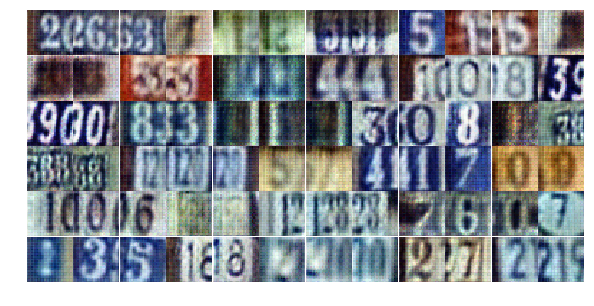

Epoch 3/10... Discriminator Loss: 1.3842... Generator reward Loss: 0.6914... Generator reconst Loss: 0.6756
Epoch 3/10... Discriminator Loss: 1.3816... Generator reward Loss: 0.8997... Generator reconst Loss: 0.6774
Epoch 3/10... Discriminator Loss: 1.3577... Generator reward Loss: 0.7406... Generator reconst Loss: 0.6725
Epoch 3/10... Discriminator Loss: 1.3179... Generator reward Loss: 0.7727... Generator reconst Loss: 0.6699
Epoch 3/10... Discriminator Loss: 1.3875... Generator reward Loss: 0.7374... Generator reconst Loss: 0.6765
Epoch 3/10... Discriminator Loss: 1.4254... Generator reward Loss: 0.6954... Generator reconst Loss: 0.6759
Epoch 3/10... Discriminator Loss: 1.3587... Generator reward Loss: 0.6796... Generator reconst Loss: 0.6730
Epoch 3/10... Discriminator Loss: 1.3869... Generator reward Loss: 0.7464... Generator reconst Loss: 0.6734
Epoch 3/10... Discriminator Loss: 1.3196... Generator reward Loss: 0.8914... Generator reconst Loss: 0.6728
Epoch 3/10... Discriminator 

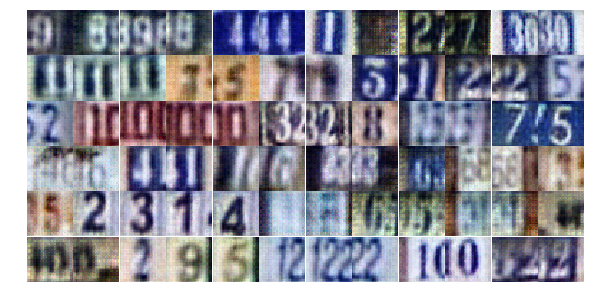

Epoch 3/10... Discriminator Loss: 1.3667... Generator reward Loss: 0.7051... Generator reconst Loss: 0.6741
Epoch 3/10... Discriminator Loss: 1.3096... Generator reward Loss: 0.7097... Generator reconst Loss: 0.6742
Epoch 3/10... Discriminator Loss: 1.3042... Generator reward Loss: 0.8238... Generator reconst Loss: 0.6774
Epoch 3/10... Discriminator Loss: 1.3950... Generator reward Loss: 0.6682... Generator reconst Loss: 0.6761
Epoch 3/10... Discriminator Loss: 1.3923... Generator reward Loss: 0.6819... Generator reconst Loss: 0.6762
Epoch 3/10... Discriminator Loss: 1.3887... Generator reward Loss: 0.5842... Generator reconst Loss: 0.6720
Epoch 3/10... Discriminator Loss: 1.3107... Generator reward Loss: 0.8619... Generator reconst Loss: 0.6755
Epoch 3/10... Discriminator Loss: 1.3206... Generator reward Loss: 0.7852... Generator reconst Loss: 0.6757
Epoch 3/10... Discriminator Loss: 1.3030... Generator reward Loss: 0.7570... Generator reconst Loss: 0.6728
Epoch 3/10... Discriminator 

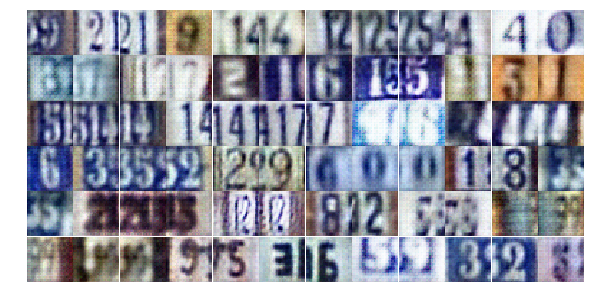

Epoch 3/10... Discriminator Loss: 1.2963... Generator reward Loss: 0.8872... Generator reconst Loss: 0.6743
Epoch 3/10... Discriminator Loss: 1.4444... Generator reward Loss: 0.6169... Generator reconst Loss: 0.6754
Epoch 3/10... Discriminator Loss: 1.4704... Generator reward Loss: 0.5180... Generator reconst Loss: 0.6754
Epoch 3/10... Discriminator Loss: 1.3370... Generator reward Loss: 0.6619... Generator reconst Loss: 0.6773
Epoch 3/10... Discriminator Loss: 1.3239... Generator reward Loss: 0.7288... Generator reconst Loss: 0.6714
Epoch 3/10... Discriminator Loss: 1.2822... Generator reward Loss: 0.6251... Generator reconst Loss: 0.6753
Epoch 3/10... Discriminator Loss: 1.4589... Generator reward Loss: 0.5594... Generator reconst Loss: 0.6713
Epoch 3/10... Discriminator Loss: 1.3994... Generator reward Loss: 0.6744... Generator reconst Loss: 0.6762
Epoch 3/10... Discriminator Loss: 1.3918... Generator reward Loss: 0.6728... Generator reconst Loss: 0.6747
Epoch 3/10... Discriminator 

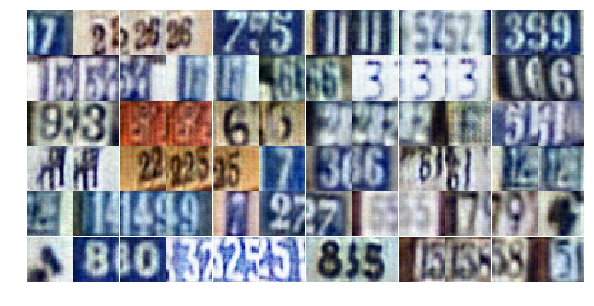

Epoch 3/10... Discriminator Loss: 1.4197... Generator reward Loss: 0.6159... Generator reconst Loss: 0.6742
Epoch 4/10... Discriminator Loss: 1.4056... Generator reward Loss: 0.6849... Generator reconst Loss: 0.6703
Epoch 4/10... Discriminator Loss: 1.2874... Generator reward Loss: 0.7462... Generator reconst Loss: 0.6759
Epoch 4/10... Discriminator Loss: 1.3323... Generator reward Loss: 0.6227... Generator reconst Loss: 0.6710
Epoch 4/10... Discriminator Loss: 1.3413... Generator reward Loss: 0.9331... Generator reconst Loss: 0.6724
Epoch 4/10... Discriminator Loss: 1.3751... Generator reward Loss: 0.6384... Generator reconst Loss: 0.6737
Epoch 4/10... Discriminator Loss: 1.4154... Generator reward Loss: 0.6230... Generator reconst Loss: 0.6738
Epoch 4/10... Discriminator Loss: 1.3334... Generator reward Loss: 0.8395... Generator reconst Loss: 0.6768
Epoch 4/10... Discriminator Loss: 1.1953... Generator reward Loss: 0.8030... Generator reconst Loss: 0.6734
Epoch 4/10... Discriminator 

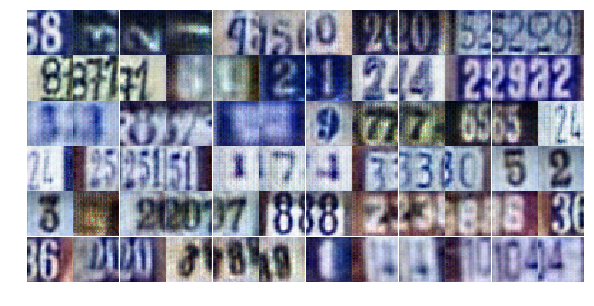

Epoch 4/10... Discriminator Loss: 1.3403... Generator reward Loss: 0.6829... Generator reconst Loss: 0.6745
Epoch 4/10... Discriminator Loss: 1.3419... Generator reward Loss: 0.5816... Generator reconst Loss: 0.6721
Epoch 4/10... Discriminator Loss: 1.2147... Generator reward Loss: 0.7353... Generator reconst Loss: 0.6735
Epoch 4/10... Discriminator Loss: 1.2655... Generator reward Loss: 0.8232... Generator reconst Loss: 0.6737
Epoch 4/10... Discriminator Loss: 1.2324... Generator reward Loss: 0.5480... Generator reconst Loss: 0.6750
Epoch 4/10... Discriminator Loss: 1.3464... Generator reward Loss: 0.6764... Generator reconst Loss: 0.6728
Epoch 4/10... Discriminator Loss: 1.4318... Generator reward Loss: 0.6119... Generator reconst Loss: 0.6751
Epoch 4/10... Discriminator Loss: 1.2301... Generator reward Loss: 0.8375... Generator reconst Loss: 0.6746
Epoch 4/10... Discriminator Loss: 1.3431... Generator reward Loss: 0.6936... Generator reconst Loss: 0.6739
Epoch 4/10... Discriminator 

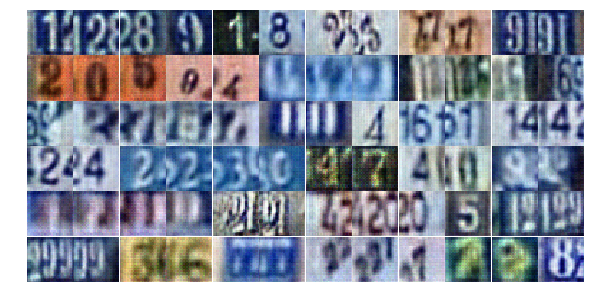

Epoch 4/10... Discriminator Loss: 1.4029... Generator reward Loss: 0.5434... Generator reconst Loss: 0.6733
Epoch 4/10... Discriminator Loss: 1.0837... Generator reward Loss: 1.2044... Generator reconst Loss: 0.6748
Epoch 4/10... Discriminator Loss: 1.3300... Generator reward Loss: 1.3230... Generator reconst Loss: 0.6736
Epoch 4/10... Discriminator Loss: 1.3070... Generator reward Loss: 0.6573... Generator reconst Loss: 0.6756
Epoch 4/10... Discriminator Loss: 1.3497... Generator reward Loss: 0.4587... Generator reconst Loss: 0.6752
Epoch 4/10... Discriminator Loss: 1.2516... Generator reward Loss: 0.5922... Generator reconst Loss: 0.6777
Epoch 4/10... Discriminator Loss: 1.3905... Generator reward Loss: 0.4159... Generator reconst Loss: 0.6702
Epoch 4/10... Discriminator Loss: 1.2880... Generator reward Loss: 0.6086... Generator reconst Loss: 0.6734
Epoch 4/10... Discriminator Loss: 1.2497... Generator reward Loss: 0.7764... Generator reconst Loss: 0.6761
Epoch 4/10... Discriminator 

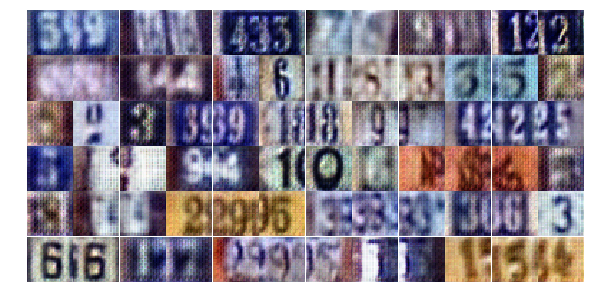

Epoch 4/10... Discriminator Loss: 1.4611... Generator reward Loss: 0.5315... Generator reconst Loss: 0.6733
Epoch 4/10... Discriminator Loss: 1.4835... Generator reward Loss: 0.4344... Generator reconst Loss: 0.6758
Epoch 4/10... Discriminator Loss: 1.3767... Generator reward Loss: 0.6991... Generator reconst Loss: 0.6763
Epoch 4/10... Discriminator Loss: 1.3356... Generator reward Loss: 0.6870... Generator reconst Loss: 0.6782
Epoch 4/10... Discriminator Loss: 1.2410... Generator reward Loss: 0.8268... Generator reconst Loss: 0.6754
Epoch 4/10... Discriminator Loss: 1.2778... Generator reward Loss: 0.7715... Generator reconst Loss: 0.6728
Epoch 4/10... Discriminator Loss: 1.2677... Generator reward Loss: 0.5228... Generator reconst Loss: 0.6770
Epoch 4/10... Discriminator Loss: 1.3877... Generator reward Loss: 0.7551... Generator reconst Loss: 0.6758
Epoch 4/10... Discriminator Loss: 1.3827... Generator reward Loss: 0.6692... Generator reconst Loss: 0.6775
Epoch 4/10... Discriminator 

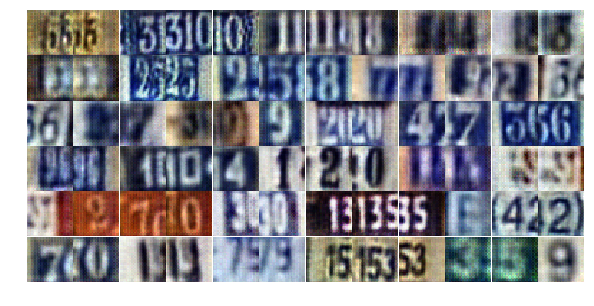

Epoch 4/10... Discriminator Loss: 1.1266... Generator reward Loss: 1.0681... Generator reconst Loss: 0.6773
Epoch 4/10... Discriminator Loss: 1.4562... Generator reward Loss: 0.3905... Generator reconst Loss: 0.6762
Epoch 4/10... Discriminator Loss: 1.4570... Generator reward Loss: 0.6941... Generator reconst Loss: 0.6742
Epoch 4/10... Discriminator Loss: 1.3909... Generator reward Loss: 0.6422... Generator reconst Loss: 0.6747
Epoch 4/10... Discriminator Loss: 1.3613... Generator reward Loss: 0.7142... Generator reconst Loss: 0.6745
Epoch 4/10... Discriminator Loss: 1.4139... Generator reward Loss: 0.7009... Generator reconst Loss: 0.6761
Epoch 4/10... Discriminator Loss: 1.3775... Generator reward Loss: 0.7129... Generator reconst Loss: 0.6727
Epoch 4/10... Discriminator Loss: 1.3495... Generator reward Loss: 0.6698... Generator reconst Loss: 0.6758
Epoch 4/10... Discriminator Loss: 1.3611... Generator reward Loss: 0.6861... Generator reconst Loss: 0.6776
Epoch 4/10... Discriminator 

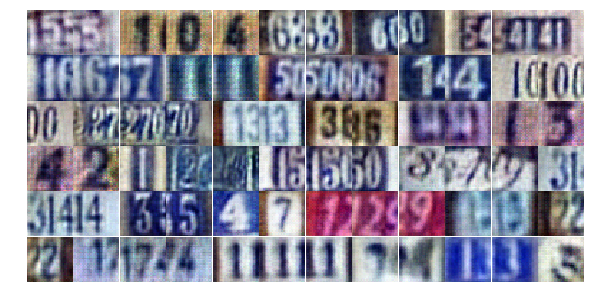

Epoch 4/10... Discriminator Loss: 1.3370... Generator reward Loss: 0.6925... Generator reconst Loss: 0.6731
Epoch 4/10... Discriminator Loss: 1.3116... Generator reward Loss: 0.8360... Generator reconst Loss: 0.6745
Epoch 4/10... Discriminator Loss: 1.3524... Generator reward Loss: 0.6975... Generator reconst Loss: 0.6746
Epoch 4/10... Discriminator Loss: 1.2384... Generator reward Loss: 1.0247... Generator reconst Loss: 0.6776
Epoch 4/10... Discriminator Loss: 1.3556... Generator reward Loss: 0.7164... Generator reconst Loss: 0.6728
Epoch 4/10... Discriminator Loss: 1.3706... Generator reward Loss: 0.6871... Generator reconst Loss: 0.6778
Epoch 4/10... Discriminator Loss: 1.3667... Generator reward Loss: 0.6283... Generator reconst Loss: 0.6737
Epoch 4/10... Discriminator Loss: 1.3534... Generator reward Loss: 0.6700... Generator reconst Loss: 0.6755
Epoch 4/10... Discriminator Loss: 1.4696... Generator reward Loss: 0.5986... Generator reconst Loss: 0.6740
Epoch 5/10... Discriminator 

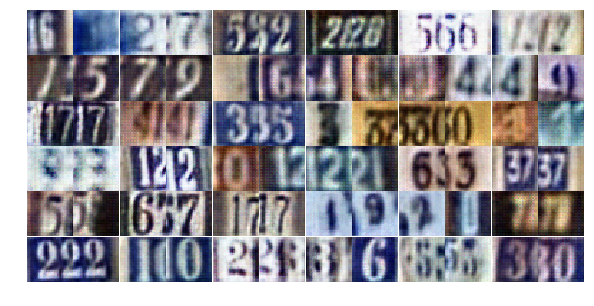

Epoch 5/10... Discriminator Loss: 1.3095... Generator reward Loss: 0.7296... Generator reconst Loss: 0.6753
Epoch 5/10... Discriminator Loss: 1.2570... Generator reward Loss: 0.7647... Generator reconst Loss: 0.6720
Epoch 5/10... Discriminator Loss: 1.3707... Generator reward Loss: 0.7528... Generator reconst Loss: 0.6760
Epoch 5/10... Discriminator Loss: 1.1812... Generator reward Loss: 1.2832... Generator reconst Loss: 0.6771
Epoch 5/10... Discriminator Loss: 1.3125... Generator reward Loss: 0.7069... Generator reconst Loss: 0.6733
Epoch 5/10... Discriminator Loss: 1.4289... Generator reward Loss: 0.8209... Generator reconst Loss: 0.6749
Epoch 5/10... Discriminator Loss: 1.2800... Generator reward Loss: 1.2534... Generator reconst Loss: 0.6760
Epoch 5/10... Discriminator Loss: 1.4317... Generator reward Loss: 0.6222... Generator reconst Loss: 0.6739
Epoch 5/10... Discriminator Loss: 1.3836... Generator reward Loss: 1.0685... Generator reconst Loss: 0.6760
Epoch 5/10... Discriminator 

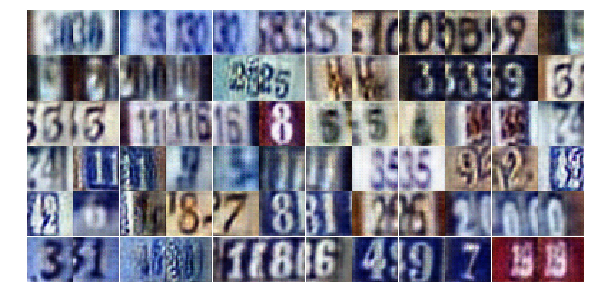

Epoch 5/10... Discriminator Loss: 1.4263... Generator reward Loss: 0.7867... Generator reconst Loss: 0.6716
Epoch 5/10... Discriminator Loss: 1.3765... Generator reward Loss: 0.7102... Generator reconst Loss: 0.6747
Epoch 5/10... Discriminator Loss: 1.3632... Generator reward Loss: 0.7371... Generator reconst Loss: 0.6758
Epoch 5/10... Discriminator Loss: 1.4030... Generator reward Loss: 0.6507... Generator reconst Loss: 0.6745
Epoch 5/10... Discriminator Loss: 1.3081... Generator reward Loss: 0.6470... Generator reconst Loss: 0.6770
Epoch 5/10... Discriminator Loss: 1.4845... Generator reward Loss: 0.7042... Generator reconst Loss: 0.6743
Epoch 5/10... Discriminator Loss: 1.4317... Generator reward Loss: 0.6420... Generator reconst Loss: 0.6750
Epoch 5/10... Discriminator Loss: 1.4087... Generator reward Loss: 0.6831... Generator reconst Loss: 0.6738
Epoch 5/10... Discriminator Loss: 1.2697... Generator reward Loss: 0.8034... Generator reconst Loss: 0.6770
Epoch 5/10... Discriminator 

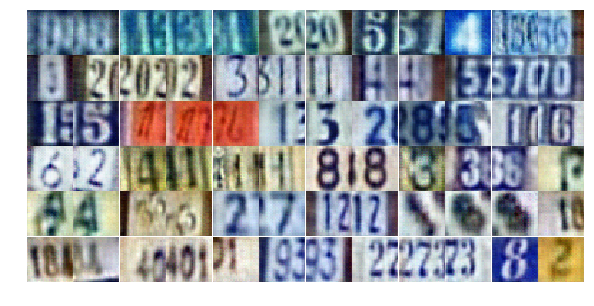

Epoch 5/10... Discriminator Loss: 1.3563... Generator reward Loss: 0.6746... Generator reconst Loss: 0.6753
Epoch 5/10... Discriminator Loss: 1.3485... Generator reward Loss: 0.7342... Generator reconst Loss: 0.6747
Epoch 5/10... Discriminator Loss: 1.3812... Generator reward Loss: 1.0270... Generator reconst Loss: 0.6770
Epoch 5/10... Discriminator Loss: 1.3266... Generator reward Loss: 0.6745... Generator reconst Loss: 0.6749
Epoch 5/10... Discriminator Loss: 1.3748... Generator reward Loss: 0.6729... Generator reconst Loss: 0.6742
Epoch 5/10... Discriminator Loss: 1.3680... Generator reward Loss: 0.5355... Generator reconst Loss: 0.6722
Epoch 5/10... Discriminator Loss: 1.3865... Generator reward Loss: 0.6767... Generator reconst Loss: 0.6707
Epoch 5/10... Discriminator Loss: 1.3591... Generator reward Loss: 0.6488... Generator reconst Loss: 0.6736
Epoch 5/10... Discriminator Loss: 1.3175... Generator reward Loss: 0.6314... Generator reconst Loss: 0.6739
Epoch 5/10... Discriminator 

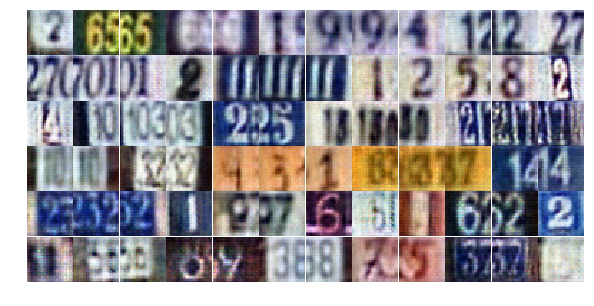

Epoch 5/10... Discriminator Loss: 1.3012... Generator reward Loss: 0.7418... Generator reconst Loss: 0.6752
Epoch 5/10... Discriminator Loss: 1.2829... Generator reward Loss: 0.6813... Generator reconst Loss: 0.6752
Epoch 5/10... Discriminator Loss: 1.3933... Generator reward Loss: 0.6719... Generator reconst Loss: 0.6748
Epoch 5/10... Discriminator Loss: 1.2150... Generator reward Loss: 0.6776... Generator reconst Loss: 0.6721
Epoch 5/10... Discriminator Loss: 1.3441... Generator reward Loss: 0.6481... Generator reconst Loss: 0.6732
Epoch 5/10... Discriminator Loss: 1.4783... Generator reward Loss: 0.5201... Generator reconst Loss: 0.6716
Epoch 5/10... Discriminator Loss: 1.3276... Generator reward Loss: 0.7016... Generator reconst Loss: 0.6756
Epoch 5/10... Discriminator Loss: 1.4065... Generator reward Loss: 0.7170... Generator reconst Loss: 0.6762
Epoch 5/10... Discriminator Loss: 1.3715... Generator reward Loss: 0.6687... Generator reconst Loss: 0.6727
Epoch 5/10... Discriminator 

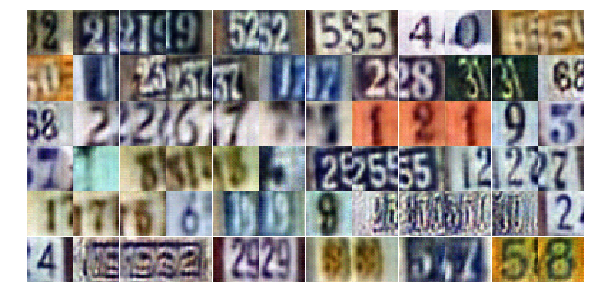

Epoch 5/10... Discriminator Loss: 1.2077... Generator reward Loss: 0.7386... Generator reconst Loss: 0.6768
Epoch 5/10... Discriminator Loss: 1.2392... Generator reward Loss: 0.8509... Generator reconst Loss: 0.6757
Epoch 5/10... Discriminator Loss: 1.1256... Generator reward Loss: 0.9500... Generator reconst Loss: 0.6703
Epoch 5/10... Discriminator Loss: 1.2458... Generator reward Loss: 0.7361... Generator reconst Loss: 0.6729
Epoch 5/10... Discriminator Loss: 1.3096... Generator reward Loss: 0.7523... Generator reconst Loss: 0.6722
Epoch 5/10... Discriminator Loss: 1.3595... Generator reward Loss: 0.6083... Generator reconst Loss: 0.6703
Epoch 5/10... Discriminator Loss: 1.3917... Generator reward Loss: 0.7813... Generator reconst Loss: 0.6731
Epoch 5/10... Discriminator Loss: 1.3586... Generator reward Loss: 0.9451... Generator reconst Loss: 0.6727
Epoch 5/10... Discriminator Loss: 1.5318... Generator reward Loss: 0.5608... Generator reconst Loss: 0.6726
Epoch 5/10... Discriminator 

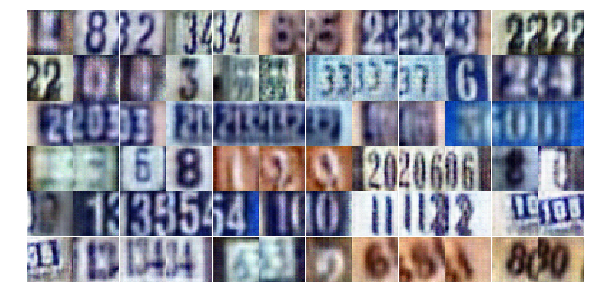

Epoch 5/10... Discriminator Loss: 1.2083... Generator reward Loss: 0.7008... Generator reconst Loss: 0.6748
Epoch 5/10... Discriminator Loss: 1.4020... Generator reward Loss: 0.6857... Generator reconst Loss: 0.6743
Epoch 5/10... Discriminator Loss: 1.3561... Generator reward Loss: 0.7906... Generator reconst Loss: 0.6752
Epoch 5/10... Discriminator Loss: 1.4378... Generator reward Loss: 0.6147... Generator reconst Loss: 0.6727
Epoch 5/10... Discriminator Loss: 1.3751... Generator reward Loss: 0.7271... Generator reconst Loss: 0.6716
Epoch 5/10... Discriminator Loss: 1.4108... Generator reward Loss: 0.5642... Generator reconst Loss: 0.6719
Epoch 6/10... Discriminator Loss: 1.4455... Generator reward Loss: 0.5736... Generator reconst Loss: 0.6756
Epoch 6/10... Discriminator Loss: 1.3139... Generator reward Loss: 0.7112... Generator reconst Loss: 0.6752
Epoch 6/10... Discriminator Loss: 1.2718... Generator reward Loss: 1.0874... Generator reconst Loss: 0.6766
Epoch 6/10... Discriminator 

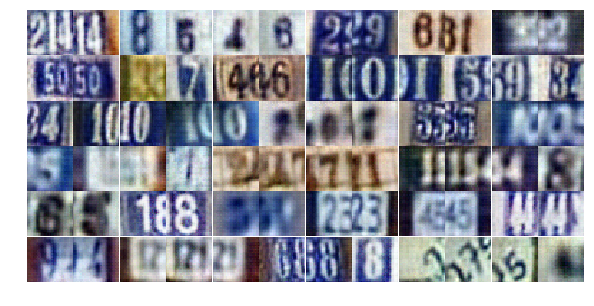

Epoch 6/10... Discriminator Loss: 1.3585... Generator reward Loss: 0.6455... Generator reconst Loss: 0.6763
Epoch 6/10... Discriminator Loss: 1.3877... Generator reward Loss: 0.9036... Generator reconst Loss: 0.6736
Epoch 6/10... Discriminator Loss: 1.3487... Generator reward Loss: 0.9437... Generator reconst Loss: 0.6734
Epoch 6/10... Discriminator Loss: 1.2852... Generator reward Loss: 0.7235... Generator reconst Loss: 0.6774
Epoch 6/10... Discriminator Loss: 1.5107... Generator reward Loss: 0.5804... Generator reconst Loss: 0.6746
Epoch 6/10... Discriminator Loss: 1.3413... Generator reward Loss: 0.6811... Generator reconst Loss: 0.6755
Epoch 6/10... Discriminator Loss: 1.2511... Generator reward Loss: 0.7182... Generator reconst Loss: 0.6721
Epoch 6/10... Discriminator Loss: 1.3315... Generator reward Loss: 0.7191... Generator reconst Loss: 0.6741
Epoch 6/10... Discriminator Loss: 1.2325... Generator reward Loss: 0.7997... Generator reconst Loss: 0.6749
Epoch 6/10... Discriminator 

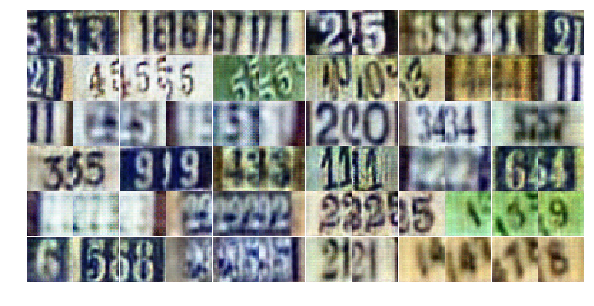

Epoch 6/10... Discriminator Loss: 1.3080... Generator reward Loss: 0.6391... Generator reconst Loss: 0.6749
Epoch 6/10... Discriminator Loss: 1.1864... Generator reward Loss: 0.8250... Generator reconst Loss: 0.6713
Epoch 6/10... Discriminator Loss: 1.3051... Generator reward Loss: 0.8114... Generator reconst Loss: 0.6762
Epoch 6/10... Discriminator Loss: 1.1803... Generator reward Loss: 0.7882... Generator reconst Loss: 0.6794
Epoch 6/10... Discriminator Loss: 1.1871... Generator reward Loss: 0.9515... Generator reconst Loss: 0.6717
Epoch 6/10... Discriminator Loss: 1.5890... Generator reward Loss: 0.5884... Generator reconst Loss: 0.6759
Epoch 6/10... Discriminator Loss: 1.3327... Generator reward Loss: 0.7922... Generator reconst Loss: 0.6733
Epoch 6/10... Discriminator Loss: 1.3710... Generator reward Loss: 0.6520... Generator reconst Loss: 0.6740
Epoch 6/10... Discriminator Loss: 1.3571... Generator reward Loss: 0.5776... Generator reconst Loss: 0.6735
Epoch 6/10... Discriminator 

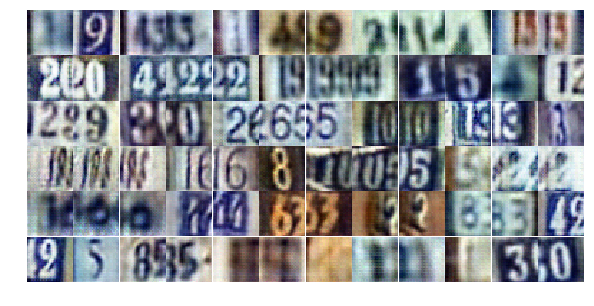

Epoch 6/10... Discriminator Loss: 1.3969... Generator reward Loss: 0.6258... Generator reconst Loss: 0.6740
Epoch 6/10... Discriminator Loss: 1.3444... Generator reward Loss: 0.6629... Generator reconst Loss: 0.6749
Epoch 6/10... Discriminator Loss: 1.4201... Generator reward Loss: 0.5330... Generator reconst Loss: 0.6738
Epoch 6/10... Discriminator Loss: 1.4028... Generator reward Loss: 0.5222... Generator reconst Loss: 0.6732
Epoch 6/10... Discriminator Loss: 1.2509... Generator reward Loss: 0.8325... Generator reconst Loss: 0.6749
Epoch 6/10... Discriminator Loss: 1.3661... Generator reward Loss: 0.5211... Generator reconst Loss: 0.6700
Epoch 6/10... Discriminator Loss: 1.6505... Generator reward Loss: 0.6700... Generator reconst Loss: 0.6710
Epoch 6/10... Discriminator Loss: 1.3222... Generator reward Loss: 0.6311... Generator reconst Loss: 0.6737
Epoch 6/10... Discriminator Loss: 1.3913... Generator reward Loss: 0.6041... Generator reconst Loss: 0.6726
Epoch 6/10... Discriminator 

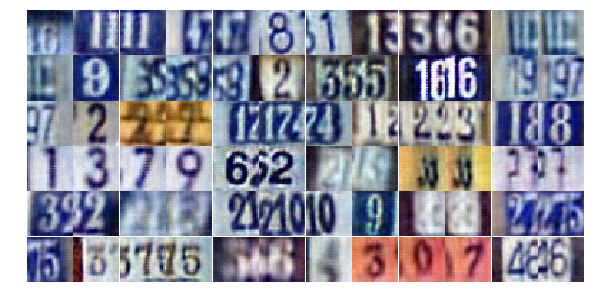

Epoch 6/10... Discriminator Loss: 1.3824... Generator reward Loss: 0.6033... Generator reconst Loss: 0.6722
Epoch 6/10... Discriminator Loss: 1.3522... Generator reward Loss: 0.8087... Generator reconst Loss: 0.6748
Epoch 6/10... Discriminator Loss: 1.4105... Generator reward Loss: 0.7165... Generator reconst Loss: 0.6732
Epoch 6/10... Discriminator Loss: 1.4531... Generator reward Loss: 0.6184... Generator reconst Loss: 0.6754
Epoch 6/10... Discriminator Loss: 1.1397... Generator reward Loss: 0.7670... Generator reconst Loss: 0.6728
Epoch 6/10... Discriminator Loss: 1.4144... Generator reward Loss: 0.5967... Generator reconst Loss: 0.6722
Epoch 6/10... Discriminator Loss: 1.2640... Generator reward Loss: 0.7413... Generator reconst Loss: 0.6747
Epoch 6/10... Discriminator Loss: 1.6017... Generator reward Loss: 0.3801... Generator reconst Loss: 0.6745
Epoch 6/10... Discriminator Loss: 1.4576... Generator reward Loss: 0.6110... Generator reconst Loss: 0.6747
Epoch 6/10... Discriminator 

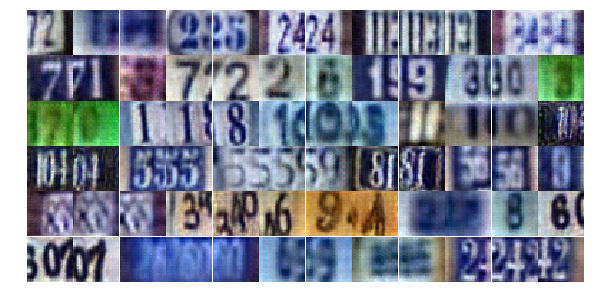

Epoch 6/10... Discriminator Loss: 1.2798... Generator reward Loss: 0.6848... Generator reconst Loss: 0.6766
Epoch 6/10... Discriminator Loss: 1.2564... Generator reward Loss: 0.7786... Generator reconst Loss: 0.6727
Epoch 6/10... Discriminator Loss: 1.3917... Generator reward Loss: 0.5966... Generator reconst Loss: 0.6723
Epoch 6/10... Discriminator Loss: 1.4562... Generator reward Loss: 0.7832... Generator reconst Loss: 0.6738
Epoch 6/10... Discriminator Loss: 1.1738... Generator reward Loss: 0.6708... Generator reconst Loss: 0.6752
Epoch 6/10... Discriminator Loss: 1.4558... Generator reward Loss: 0.6656... Generator reconst Loss: 0.6754
Epoch 6/10... Discriminator Loss: 1.4080... Generator reward Loss: 0.6445... Generator reconst Loss: 0.6788
Epoch 6/10... Discriminator Loss: 1.2080... Generator reward Loss: 1.1012... Generator reconst Loss: 0.6758
Epoch 6/10... Discriminator Loss: 1.4160... Generator reward Loss: 0.6644... Generator reconst Loss: 0.6746
Epoch 6/10... Discriminator 

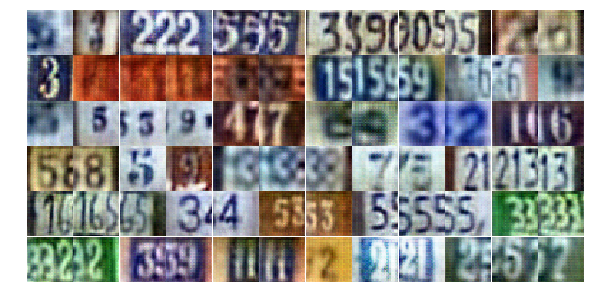

Epoch 6/10... Discriminator Loss: 1.4592... Generator reward Loss: 0.5998... Generator reconst Loss: 0.6730
Epoch 6/10... Discriminator Loss: 1.2985... Generator reward Loss: 0.6110... Generator reconst Loss: 0.6766
Epoch 6/10... Discriminator Loss: 1.3613... Generator reward Loss: 0.8564... Generator reconst Loss: 0.6724
Epoch 7/10... Discriminator Loss: 1.5518... Generator reward Loss: 0.4830... Generator reconst Loss: 0.6721
Epoch 7/10... Discriminator Loss: 1.3355... Generator reward Loss: 0.8076... Generator reconst Loss: 0.6730
Epoch 7/10... Discriminator Loss: 1.4068... Generator reward Loss: 0.7192... Generator reconst Loss: 0.6789
Epoch 7/10... Discriminator Loss: 1.3878... Generator reward Loss: 0.5766... Generator reconst Loss: 0.6697
Epoch 7/10... Discriminator Loss: 1.2512... Generator reward Loss: 0.9808... Generator reconst Loss: 0.6739
Epoch 7/10... Discriminator Loss: 1.2325... Generator reward Loss: 0.7971... Generator reconst Loss: 0.6712
Epoch 7/10... Discriminator 

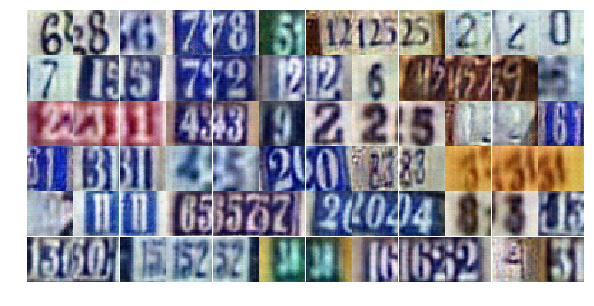

Epoch 7/10... Discriminator Loss: 1.3790... Generator reward Loss: 0.5790... Generator reconst Loss: 0.6733
Epoch 7/10... Discriminator Loss: 1.4468... Generator reward Loss: 0.6011... Generator reconst Loss: 0.6762
Epoch 7/10... Discriminator Loss: 1.3997... Generator reward Loss: 0.6138... Generator reconst Loss: 0.6734
Epoch 7/10... Discriminator Loss: 1.2739... Generator reward Loss: 0.9275... Generator reconst Loss: 0.6762
Epoch 7/10... Discriminator Loss: 1.3508... Generator reward Loss: 0.7128... Generator reconst Loss: 0.6743
Epoch 7/10... Discriminator Loss: 1.3405... Generator reward Loss: 0.6506... Generator reconst Loss: 0.6710
Epoch 7/10... Discriminator Loss: 1.6260... Generator reward Loss: 0.4352... Generator reconst Loss: 0.6752
Epoch 7/10... Discriminator Loss: 1.3029... Generator reward Loss: 0.7510... Generator reconst Loss: 0.6723
Epoch 7/10... Discriminator Loss: 1.4262... Generator reward Loss: 0.6465... Generator reconst Loss: 0.6745
Epoch 7/10... Discriminator 

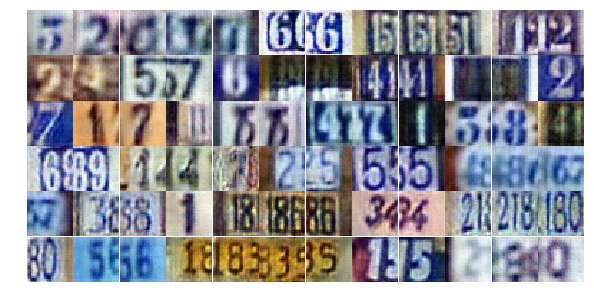

Epoch 7/10... Discriminator Loss: 1.3111... Generator reward Loss: 0.6767... Generator reconst Loss: 0.6768
Epoch 7/10... Discriminator Loss: 1.3643... Generator reward Loss: 0.7580... Generator reconst Loss: 0.6717
Epoch 7/10... Discriminator Loss: 1.6995... Generator reward Loss: 1.3077... Generator reconst Loss: 0.6748
Epoch 7/10... Discriminator Loss: 1.4933... Generator reward Loss: 0.7836... Generator reconst Loss: 0.6752
Epoch 7/10... Discriminator Loss: 1.2818... Generator reward Loss: 0.8240... Generator reconst Loss: 0.6709
Epoch 7/10... Discriminator Loss: 1.3049... Generator reward Loss: 0.6515... Generator reconst Loss: 0.6755
Epoch 7/10... Discriminator Loss: 1.6577... Generator reward Loss: 0.4500... Generator reconst Loss: 0.6751
Epoch 7/10... Discriminator Loss: 1.3967... Generator reward Loss: 0.6393... Generator reconst Loss: 0.6751
Epoch 7/10... Discriminator Loss: 1.2621... Generator reward Loss: 0.7593... Generator reconst Loss: 0.6724
Epoch 7/10... Discriminator 

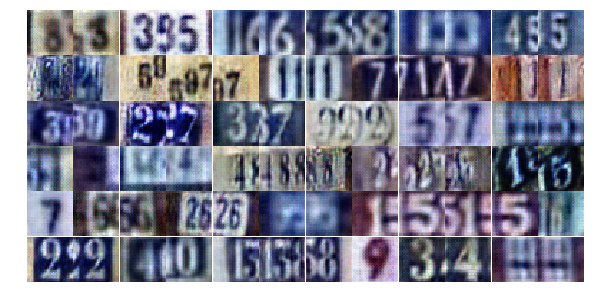

Epoch 7/10... Discriminator Loss: 1.4970... Generator reward Loss: 0.5476... Generator reconst Loss: 0.6762
Epoch 7/10... Discriminator Loss: 1.2279... Generator reward Loss: 0.7350... Generator reconst Loss: 0.6744
Epoch 7/10... Discriminator Loss: 1.3228... Generator reward Loss: 0.7240... Generator reconst Loss: 0.6766
Epoch 7/10... Discriminator Loss: 0.8151... Generator reward Loss: 1.3584... Generator reconst Loss: 0.6752
Epoch 7/10... Discriminator Loss: 1.4822... Generator reward Loss: 0.5346... Generator reconst Loss: 0.6708
Epoch 7/10... Discriminator Loss: 1.4690... Generator reward Loss: 0.6166... Generator reconst Loss: 0.6733
Epoch 7/10... Discriminator Loss: 1.4380... Generator reward Loss: 0.5933... Generator reconst Loss: 0.6764
Epoch 7/10... Discriminator Loss: 1.2970... Generator reward Loss: 0.6914... Generator reconst Loss: 0.6734
Epoch 7/10... Discriminator Loss: 1.3844... Generator reward Loss: 0.6830... Generator reconst Loss: 0.6770
Epoch 7/10... Discriminator 

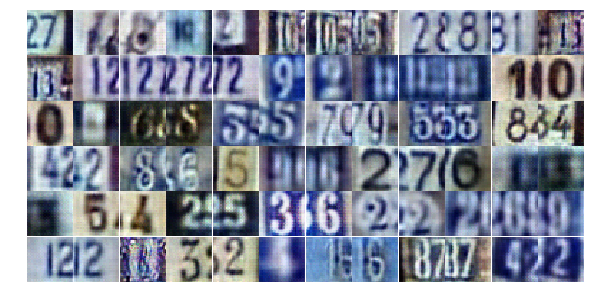

Epoch 7/10... Discriminator Loss: 1.3542... Generator reward Loss: 0.7145... Generator reconst Loss: 0.6734
Epoch 7/10... Discriminator Loss: 1.3343... Generator reward Loss: 0.4782... Generator reconst Loss: 0.6718
Epoch 7/10... Discriminator Loss: 1.5041... Generator reward Loss: 0.5343... Generator reconst Loss: 0.6749
Epoch 7/10... Discriminator Loss: 1.3441... Generator reward Loss: 0.7089... Generator reconst Loss: 0.6733
Epoch 7/10... Discriminator Loss: 1.2911... Generator reward Loss: 0.7581... Generator reconst Loss: 0.6738
Epoch 7/10... Discriminator Loss: 1.3604... Generator reward Loss: 0.6655... Generator reconst Loss: 0.6763
Epoch 7/10... Discriminator Loss: 1.3227... Generator reward Loss: 0.7794... Generator reconst Loss: 0.6753
Epoch 7/10... Discriminator Loss: 1.4771... Generator reward Loss: 0.4354... Generator reconst Loss: 0.6756
Epoch 7/10... Discriminator Loss: 1.2572... Generator reward Loss: 0.7212... Generator reconst Loss: 0.6728
Epoch 7/10... Discriminator 

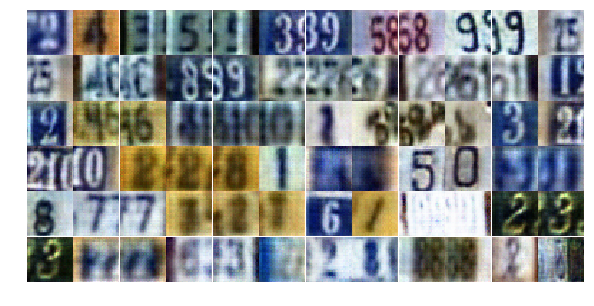

Epoch 7/10... Discriminator Loss: 1.3263... Generator reward Loss: 0.7272... Generator reconst Loss: 0.6750
Epoch 7/10... Discriminator Loss: 1.0757... Generator reward Loss: 0.8091... Generator reconst Loss: 0.6717
Epoch 7/10... Discriminator Loss: 1.4058... Generator reward Loss: 0.6430... Generator reconst Loss: 0.6751
Epoch 7/10... Discriminator Loss: 1.1936... Generator reward Loss: 0.8599... Generator reconst Loss: 0.6721
Epoch 7/10... Discriminator Loss: 1.3198... Generator reward Loss: 0.6790... Generator reconst Loss: 0.6722
Epoch 7/10... Discriminator Loss: 1.5157... Generator reward Loss: 0.5285... Generator reconst Loss: 0.6742
Epoch 7/10... Discriminator Loss: 1.2052... Generator reward Loss: 0.8260... Generator reconst Loss: 0.6749
Epoch 7/10... Discriminator Loss: 1.1734... Generator reward Loss: 0.8093... Generator reconst Loss: 0.6748
Epoch 7/10... Discriminator Loss: 1.3318... Generator reward Loss: 0.6848... Generator reconst Loss: 0.6752
Epoch 7/10... Discriminator 

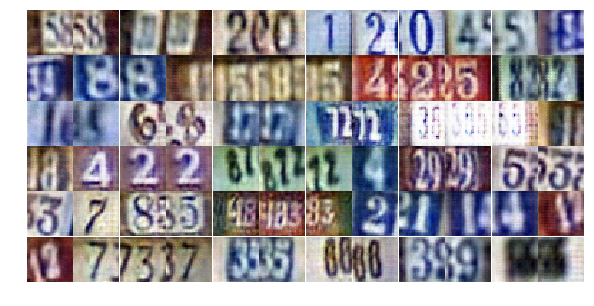

Epoch 7/10... Discriminator Loss: 1.4313... Generator reward Loss: 0.8785... Generator reconst Loss: 0.6724
Epoch 8/10... Discriminator Loss: 1.4398... Generator reward Loss: 0.6229... Generator reconst Loss: 0.6764
Epoch 8/10... Discriminator Loss: 1.1541... Generator reward Loss: 0.8292... Generator reconst Loss: 0.6763
Epoch 8/10... Discriminator Loss: 1.2950... Generator reward Loss: 0.8228... Generator reconst Loss: 0.6777
Epoch 8/10... Discriminator Loss: 1.1288... Generator reward Loss: 0.8852... Generator reconst Loss: 0.6742
Epoch 8/10... Discriminator Loss: 1.4711... Generator reward Loss: 0.4869... Generator reconst Loss: 0.6751
Epoch 8/10... Discriminator Loss: 1.3879... Generator reward Loss: 0.6081... Generator reconst Loss: 0.6723
Epoch 8/10... Discriminator Loss: 1.2059... Generator reward Loss: 0.7601... Generator reconst Loss: 0.6725
Epoch 8/10... Discriminator Loss: 1.2537... Generator reward Loss: 0.6846... Generator reconst Loss: 0.6729
Epoch 8/10... Discriminator 

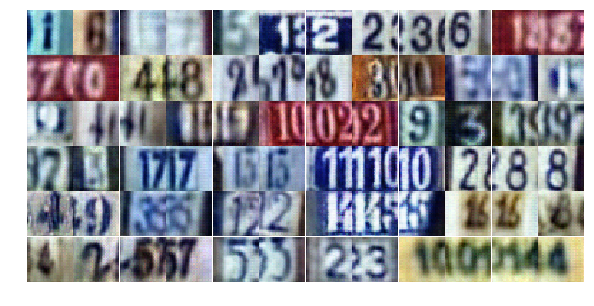

Epoch 8/10... Discriminator Loss: 1.2544... Generator reward Loss: 0.6059... Generator reconst Loss: 0.6758
Epoch 8/10... Discriminator Loss: 1.0395... Generator reward Loss: 1.0557... Generator reconst Loss: 0.6735
Epoch 8/10... Discriminator Loss: 1.5181... Generator reward Loss: 0.6022... Generator reconst Loss: 0.6735
Epoch 8/10... Discriminator Loss: 1.3842... Generator reward Loss: 0.6521... Generator reconst Loss: 0.6758
Epoch 8/10... Discriminator Loss: 1.4795... Generator reward Loss: 0.6647... Generator reconst Loss: 0.6747
Epoch 8/10... Discriminator Loss: 1.2267... Generator reward Loss: 0.7049... Generator reconst Loss: 0.6741
Epoch 8/10... Discriminator Loss: 1.1789... Generator reward Loss: 0.9319... Generator reconst Loss: 0.6739
Epoch 8/10... Discriminator Loss: 1.4015... Generator reward Loss: 0.7109... Generator reconst Loss: 0.6748
Epoch 8/10... Discriminator Loss: 1.1949... Generator reward Loss: 0.8440... Generator reconst Loss: 0.6742
Epoch 8/10... Discriminator 

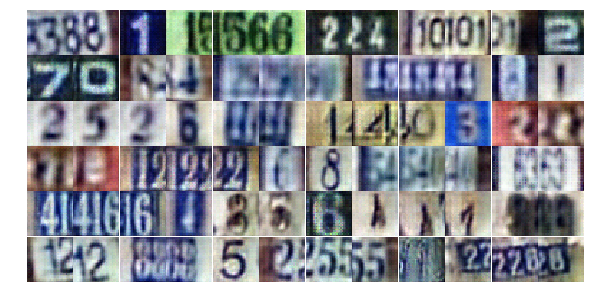

Epoch 8/10... Discriminator Loss: 1.2832... Generator reward Loss: 0.6474... Generator reconst Loss: 0.6733
Epoch 8/10... Discriminator Loss: 1.0523... Generator reward Loss: 0.8763... Generator reconst Loss: 0.6801
Epoch 8/10... Discriminator Loss: 0.9284... Generator reward Loss: 1.1680... Generator reconst Loss: 0.6747
Epoch 8/10... Discriminator Loss: 1.3795... Generator reward Loss: 0.5206... Generator reconst Loss: 0.6783
Epoch 8/10... Discriminator Loss: 1.2860... Generator reward Loss: 0.9014... Generator reconst Loss: 0.6779
Epoch 8/10... Discriminator Loss: 1.4272... Generator reward Loss: 0.5439... Generator reconst Loss: 0.6737
Epoch 8/10... Discriminator Loss: 1.3573... Generator reward Loss: 0.8047... Generator reconst Loss: 0.6698
Epoch 8/10... Discriminator Loss: 1.1317... Generator reward Loss: 1.0211... Generator reconst Loss: 0.6747
Epoch 8/10... Discriminator Loss: 1.3738... Generator reward Loss: 1.4633... Generator reconst Loss: 0.6758
Epoch 8/10... Discriminator 

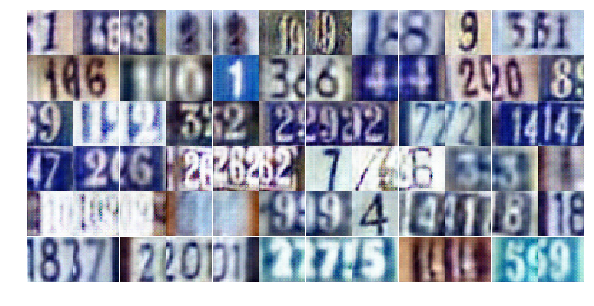

Epoch 8/10... Discriminator Loss: 1.3998... Generator reward Loss: 0.6583... Generator reconst Loss: 0.6735
Epoch 8/10... Discriminator Loss: 1.4966... Generator reward Loss: 0.6232... Generator reconst Loss: 0.6705
Epoch 8/10... Discriminator Loss: 1.3558... Generator reward Loss: 0.5738... Generator reconst Loss: 0.6739
Epoch 8/10... Discriminator Loss: 1.4218... Generator reward Loss: 0.7520... Generator reconst Loss: 0.6735
Epoch 8/10... Discriminator Loss: 1.1937... Generator reward Loss: 0.9167... Generator reconst Loss: 0.6722
Epoch 8/10... Discriminator Loss: 1.3932... Generator reward Loss: 0.7043... Generator reconst Loss: 0.6756
Epoch 8/10... Discriminator Loss: 1.3599... Generator reward Loss: 0.9030... Generator reconst Loss: 0.6751
Epoch 8/10... Discriminator Loss: 1.1705... Generator reward Loss: 0.9056... Generator reconst Loss: 0.6742
Epoch 8/10... Discriminator Loss: 1.3634... Generator reward Loss: 0.7088... Generator reconst Loss: 0.6743
Epoch 8/10... Discriminator 

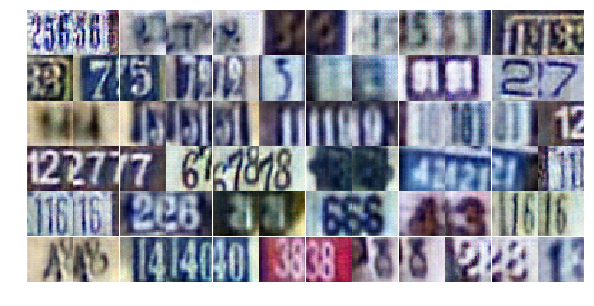

Epoch 8/10... Discriminator Loss: 1.3324... Generator reward Loss: 0.7550... Generator reconst Loss: 0.6742
Epoch 8/10... Discriminator Loss: 1.2430... Generator reward Loss: 0.8449... Generator reconst Loss: 0.6766
Epoch 8/10... Discriminator Loss: 1.3602... Generator reward Loss: 0.6439... Generator reconst Loss: 0.6774
Epoch 8/10... Discriminator Loss: 1.2681... Generator reward Loss: 0.7170... Generator reconst Loss: 0.6733
Epoch 8/10... Discriminator Loss: 1.2717... Generator reward Loss: 0.7664... Generator reconst Loss: 0.6743
Epoch 8/10... Discriminator Loss: 1.1559... Generator reward Loss: 0.8833... Generator reconst Loss: 0.6734
Epoch 8/10... Discriminator Loss: 1.0113... Generator reward Loss: 1.2439... Generator reconst Loss: 0.6757
Epoch 8/10... Discriminator Loss: 1.3311... Generator reward Loss: 0.6976... Generator reconst Loss: 0.6744
Epoch 8/10... Discriminator Loss: 1.1511... Generator reward Loss: 0.8185... Generator reconst Loss: 0.6731
Epoch 8/10... Discriminator 

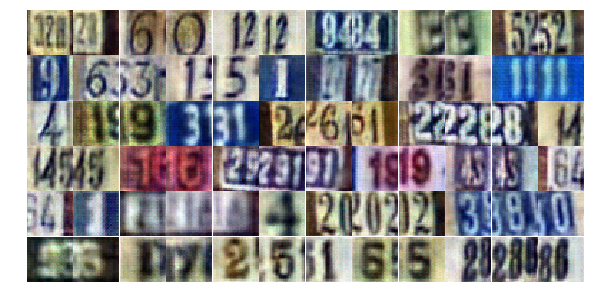

Epoch 8/10... Discriminator Loss: 1.0106... Generator reward Loss: 0.9013... Generator reconst Loss: 0.6773
Epoch 8/10... Discriminator Loss: 1.2483... Generator reward Loss: 0.9958... Generator reconst Loss: 0.6743
Epoch 8/10... Discriminator Loss: 1.1689... Generator reward Loss: 0.6897... Generator reconst Loss: 0.6733
Epoch 8/10... Discriminator Loss: 1.0411... Generator reward Loss: 1.0160... Generator reconst Loss: 0.6740
Epoch 8/10... Discriminator Loss: 1.3222... Generator reward Loss: 0.7057... Generator reconst Loss: 0.6761
Epoch 8/10... Discriminator Loss: 1.3570... Generator reward Loss: 0.6234... Generator reconst Loss: 0.6749
Epoch 8/10... Discriminator Loss: 1.3256... Generator reward Loss: 0.7559... Generator reconst Loss: 0.6750
Epoch 8/10... Discriminator Loss: 1.2985... Generator reward Loss: 0.9303... Generator reconst Loss: 0.6765
Epoch 9/10... Discriminator Loss: 1.3390... Generator reward Loss: 0.7311... Generator reconst Loss: 0.6741
Epoch 9/10... Discriminator 

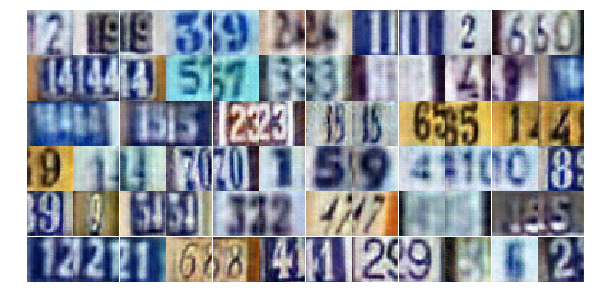

Epoch 9/10... Discriminator Loss: 1.3633... Generator reward Loss: 0.5148... Generator reconst Loss: 0.6765
Epoch 9/10... Discriminator Loss: 1.3274... Generator reward Loss: 0.6076... Generator reconst Loss: 0.6770
Epoch 9/10... Discriminator Loss: 1.4240... Generator reward Loss: 0.7334... Generator reconst Loss: 0.6752
Epoch 9/10... Discriminator Loss: 1.4104... Generator reward Loss: 0.6769... Generator reconst Loss: 0.6753
Epoch 9/10... Discriminator Loss: 1.4252... Generator reward Loss: 0.6620... Generator reconst Loss: 0.6770
Epoch 9/10... Discriminator Loss: 1.4119... Generator reward Loss: 0.5471... Generator reconst Loss: 0.6762
Epoch 9/10... Discriminator Loss: 1.3713... Generator reward Loss: 0.7347... Generator reconst Loss: 0.6757
Epoch 9/10... Discriminator Loss: 1.4979... Generator reward Loss: 0.4083... Generator reconst Loss: 0.6734
Epoch 9/10... Discriminator Loss: 1.2670... Generator reward Loss: 0.7098... Generator reconst Loss: 0.6738
Epoch 9/10... Discriminator 

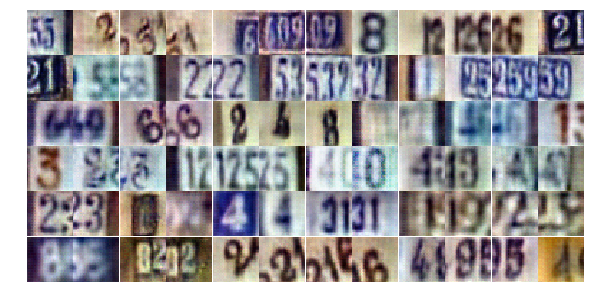

Epoch 9/10... Discriminator Loss: 1.4817... Generator reward Loss: 0.4258... Generator reconst Loss: 0.6741
Epoch 9/10... Discriminator Loss: 1.1623... Generator reward Loss: 0.8844... Generator reconst Loss: 0.6715
Epoch 9/10... Discriminator Loss: 1.6252... Generator reward Loss: 0.3350... Generator reconst Loss: 0.6711
Epoch 9/10... Discriminator Loss: 1.1797... Generator reward Loss: 0.8714... Generator reconst Loss: 0.6740
Epoch 9/10... Discriminator Loss: 1.3306... Generator reward Loss: 0.5743... Generator reconst Loss: 0.6767
Epoch 9/10... Discriminator Loss: 1.5204... Generator reward Loss: 0.4461... Generator reconst Loss: 0.6738
Epoch 9/10... Discriminator Loss: 1.4381... Generator reward Loss: 0.4089... Generator reconst Loss: 0.6738
Epoch 9/10... Discriminator Loss: 1.5528... Generator reward Loss: 0.3810... Generator reconst Loss: 0.6737
Epoch 9/10... Discriminator Loss: 1.2867... Generator reward Loss: 0.9814... Generator reconst Loss: 0.6750
Epoch 9/10... Discriminator 

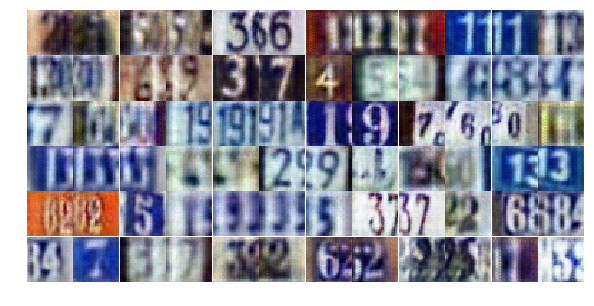

Epoch 9/10... Discriminator Loss: 1.3049... Generator reward Loss: 0.7327... Generator reconst Loss: 0.6762
Epoch 9/10... Discriminator Loss: 1.5704... Generator reward Loss: 1.4171... Generator reconst Loss: 0.6731
Epoch 9/10... Discriminator Loss: 1.3447... Generator reward Loss: 0.9558... Generator reconst Loss: 0.6736
Epoch 9/10... Discriminator Loss: 1.1328... Generator reward Loss: 0.7262... Generator reconst Loss: 0.6750
Epoch 9/10... Discriminator Loss: 1.1404... Generator reward Loss: 1.1939... Generator reconst Loss: 0.6728
Epoch 9/10... Discriminator Loss: 1.2570... Generator reward Loss: 0.8719... Generator reconst Loss: 0.6710
Epoch 9/10... Discriminator Loss: 1.1897... Generator reward Loss: 0.8538... Generator reconst Loss: 0.6736
Epoch 9/10... Discriminator Loss: 1.4486... Generator reward Loss: 1.0997... Generator reconst Loss: 0.6759
Epoch 9/10... Discriminator Loss: 1.3995... Generator reward Loss: 0.8110... Generator reconst Loss: 0.6768
Epoch 9/10... Discriminator 

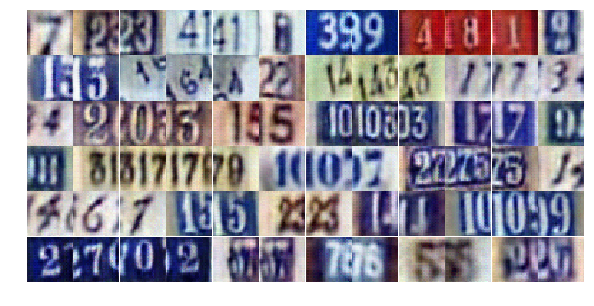

Epoch 9/10... Discriminator Loss: 1.2931... Generator reward Loss: 0.7569... Generator reconst Loss: 0.6753
Epoch 9/10... Discriminator Loss: 1.1083... Generator reward Loss: 0.7482... Generator reconst Loss: 0.6753
Epoch 9/10... Discriminator Loss: 0.6188... Generator reward Loss: 1.8518... Generator reconst Loss: 0.6771
Epoch 9/10... Discriminator Loss: 0.9688... Generator reward Loss: 1.0605... Generator reconst Loss: 0.6765
Epoch 9/10... Discriminator Loss: 1.4012... Generator reward Loss: 0.6226... Generator reconst Loss: 0.6778
Epoch 9/10... Discriminator Loss: 0.8443... Generator reward Loss: 1.6448... Generator reconst Loss: 0.6742
Epoch 9/10... Discriminator Loss: 1.5521... Generator reward Loss: 1.2713... Generator reconst Loss: 0.6721
Epoch 9/10... Discriminator Loss: 0.8863... Generator reward Loss: 1.2899... Generator reconst Loss: 0.6736
Epoch 9/10... Discriminator Loss: 1.3975... Generator reward Loss: 0.8144... Generator reconst Loss: 0.6722
Epoch 9/10... Discriminator 

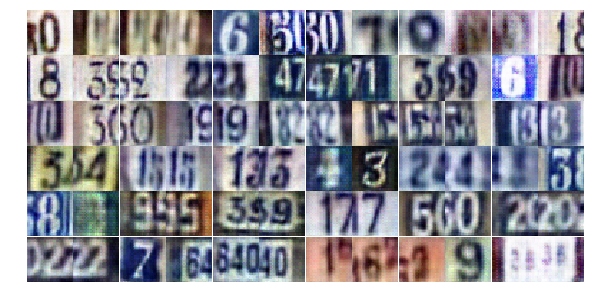

Epoch 9/10... Discriminator Loss: 0.8175... Generator reward Loss: 1.5366... Generator reconst Loss: 0.6771
Epoch 9/10... Discriminator Loss: 1.4943... Generator reward Loss: 0.3184... Generator reconst Loss: 0.6734
Epoch 9/10... Discriminator Loss: 1.1819... Generator reward Loss: 0.6501... Generator reconst Loss: 0.6693
Epoch 9/10... Discriminator Loss: 1.4174... Generator reward Loss: 0.8911... Generator reconst Loss: 0.6738
Epoch 9/10... Discriminator Loss: 1.5062... Generator reward Loss: 0.6745... Generator reconst Loss: 0.6731
Epoch 9/10... Discriminator Loss: 1.4029... Generator reward Loss: 0.5572... Generator reconst Loss: 0.6749
Epoch 9/10... Discriminator Loss: 1.3853... Generator reward Loss: 0.7160... Generator reconst Loss: 0.6770
Epoch 9/10... Discriminator Loss: 1.7971... Generator reward Loss: 0.2989... Generator reconst Loss: 0.6719
Epoch 9/10... Discriminator Loss: 1.4295... Generator reward Loss: 0.5427... Generator reconst Loss: 0.6739
Epoch 9/10... Discriminator 

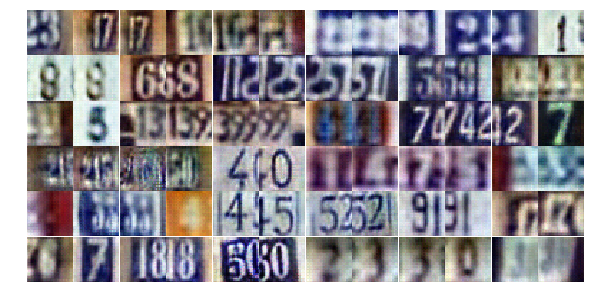

Epoch 9/10... Discriminator Loss: 1.1814... Generator reward Loss: 1.1580... Generator reconst Loss: 0.6734
Epoch 9/10... Discriminator Loss: 1.4809... Generator reward Loss: 1.0571... Generator reconst Loss: 0.6753
Epoch 9/10... Discriminator Loss: 1.2478... Generator reward Loss: 0.7971... Generator reconst Loss: 0.6755
Epoch 9/10... Discriminator Loss: 1.1116... Generator reward Loss: 0.7275... Generator reconst Loss: 0.6751
Epoch 9/10... Discriminator Loss: 1.0347... Generator reward Loss: 0.8277... Generator reconst Loss: 0.6754
Epoch 10/10... Discriminator Loss: 1.3183... Generator reward Loss: 0.6299... Generator reconst Loss: 0.6746
Epoch 10/10... Discriminator Loss: 1.2845... Generator reward Loss: 0.6322... Generator reconst Loss: 0.6711
Epoch 10/10... Discriminator Loss: 0.7496... Generator reward Loss: 1.1208... Generator reconst Loss: 0.6726
Epoch 10/10... Discriminator Loss: 1.1625... Generator reward Loss: 0.7093... Generator reconst Loss: 0.6747
Epoch 10/10... Discrimin

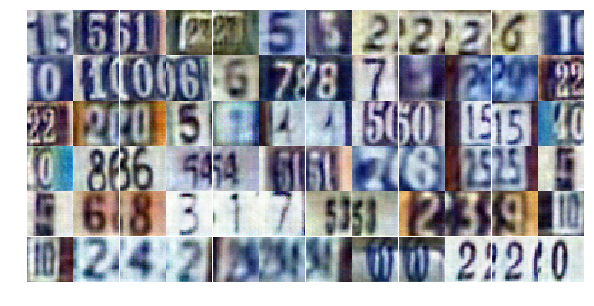

Epoch 10/10... Discriminator Loss: 0.8293... Generator reward Loss: 0.9412... Generator reconst Loss: 0.6776
Epoch 10/10... Discriminator Loss: 1.3878... Generator reward Loss: 0.8389... Generator reconst Loss: 0.6750
Epoch 10/10... Discriminator Loss: 1.2744... Generator reward Loss: 0.7320... Generator reconst Loss: 0.6742
Epoch 10/10... Discriminator Loss: 1.2583... Generator reward Loss: 0.8935... Generator reconst Loss: 0.6721
Epoch 10/10... Discriminator Loss: 1.1410... Generator reward Loss: 0.8147... Generator reconst Loss: 0.6749
Epoch 10/10... Discriminator Loss: 1.1373... Generator reward Loss: 0.7614... Generator reconst Loss: 0.6759
Epoch 10/10... Discriminator Loss: 1.1392... Generator reward Loss: 0.7861... Generator reconst Loss: 0.6766
Epoch 10/10... Discriminator Loss: 1.2132... Generator reward Loss: 0.8815... Generator reconst Loss: 0.6758
Epoch 10/10... Discriminator Loss: 1.4756... Generator reward Loss: 0.9549... Generator reconst Loss: 0.6708
Epoch 10/10... Disc

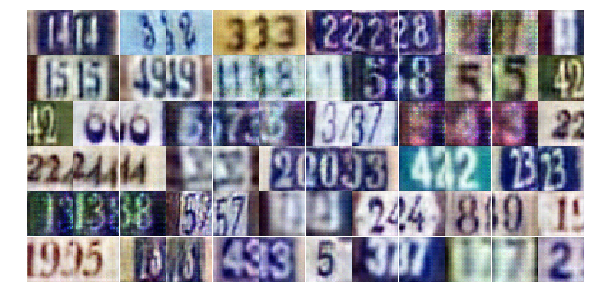

Epoch 10/10... Discriminator Loss: 0.9054... Generator reward Loss: 0.8654... Generator reconst Loss: 0.6755
Epoch 10/10... Discriminator Loss: 1.8472... Generator reward Loss: 0.2726... Generator reconst Loss: 0.6747
Epoch 10/10... Discriminator Loss: 0.9115... Generator reward Loss: 1.2337... Generator reconst Loss: 0.6768
Epoch 10/10... Discriminator Loss: 1.2559... Generator reward Loss: 1.6848... Generator reconst Loss: 0.6733
Epoch 10/10... Discriminator Loss: 0.9049... Generator reward Loss: 1.4568... Generator reconst Loss: 0.6732
Epoch 10/10... Discriminator Loss: 0.6891... Generator reward Loss: 1.2136... Generator reconst Loss: 0.6736
Epoch 10/10... Discriminator Loss: 1.2220... Generator reward Loss: 0.7615... Generator reconst Loss: 0.6704
Epoch 10/10... Discriminator Loss: 1.0930... Generator reward Loss: 0.9888... Generator reconst Loss: 0.6739
Epoch 10/10... Discriminator Loss: 1.3368... Generator reward Loss: 1.1325... Generator reconst Loss: 0.6743
Epoch 10/10... Disc

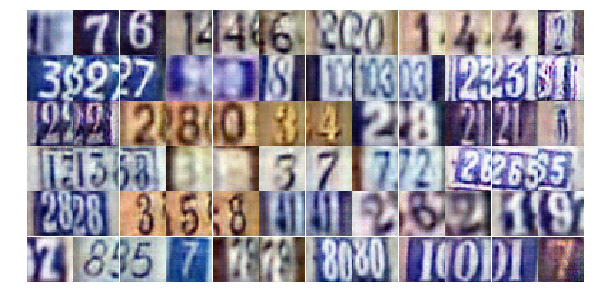

Epoch 10/10... Discriminator Loss: 1.1467... Generator reward Loss: 0.8036... Generator reconst Loss: 0.6769
Epoch 10/10... Discriminator Loss: 1.4703... Generator reward Loss: 0.8568... Generator reconst Loss: 0.6739
Epoch 10/10... Discriminator Loss: 1.1855... Generator reward Loss: 1.6298... Generator reconst Loss: 0.6753
Epoch 10/10... Discriminator Loss: 1.0260... Generator reward Loss: 0.6431... Generator reconst Loss: 0.6719
Epoch 10/10... Discriminator Loss: 0.8689... Generator reward Loss: 1.9823... Generator reconst Loss: 0.6750
Epoch 10/10... Discriminator Loss: 0.6856... Generator reward Loss: 1.3535... Generator reconst Loss: 0.6745
Epoch 10/10... Discriminator Loss: 0.6038... Generator reward Loss: 1.2138... Generator reconst Loss: 0.6756
Epoch 10/10... Discriminator Loss: 0.3306... Generator reward Loss: 1.5988... Generator reconst Loss: 0.6786
Epoch 10/10... Discriminator Loss: 1.2301... Generator reward Loss: 0.8876... Generator reconst Loss: 0.6741
Epoch 10/10... Disc

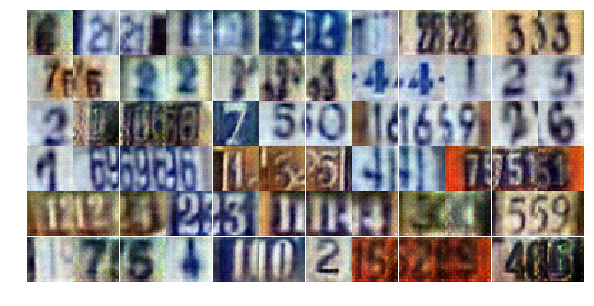

Epoch 10/10... Discriminator Loss: 1.9589... Generator reward Loss: 0.2322... Generator reconst Loss: 0.6763
Epoch 10/10... Discriminator Loss: 1.0877... Generator reward Loss: 0.5667... Generator reconst Loss: 0.6726
Epoch 10/10... Discriminator Loss: 0.9538... Generator reward Loss: 0.6483... Generator reconst Loss: 0.6731
Epoch 10/10... Discriminator Loss: 1.4853... Generator reward Loss: 0.8751... Generator reconst Loss: 0.6728
Epoch 10/10... Discriminator Loss: 1.0871... Generator reward Loss: 1.0627... Generator reconst Loss: 0.6752
Epoch 10/10... Discriminator Loss: 1.4770... Generator reward Loss: 1.6971... Generator reconst Loss: 0.6748
Epoch 10/10... Discriminator Loss: 0.9523... Generator reward Loss: 1.7329... Generator reconst Loss: 0.6711
Epoch 10/10... Discriminator Loss: 1.3086... Generator reward Loss: 0.6834... Generator reconst Loss: 0.6744
Epoch 10/10... Discriminator Loss: 0.4693... Generator reward Loss: 2.3467... Generator reconst Loss: 0.6765
Epoch 10/10... Disc

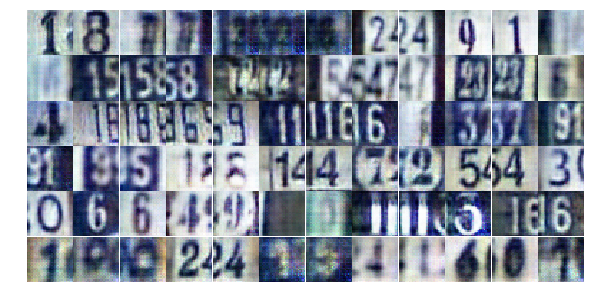

Epoch 10/10... Discriminator Loss: 1.2893... Generator reward Loss: 0.4622... Generator reconst Loss: 0.6758
Epoch 10/10... Discriminator Loss: 1.3553... Generator reward Loss: 0.5048... Generator reconst Loss: 0.6715
Epoch 10/10... Discriminator Loss: 0.8023... Generator reward Loss: 1.1965... Generator reconst Loss: 0.6749
Epoch 10/10... Discriminator Loss: 0.8731... Generator reward Loss: 1.1571... Generator reconst Loss: 0.6795
Epoch 10/10... Discriminator Loss: 1.2471... Generator reward Loss: 0.5757... Generator reconst Loss: 0.6748
Epoch 10/10... Discriminator Loss: 0.5809... Generator reward Loss: 1.4199... Generator reconst Loss: 0.6730
Epoch 10/10... Discriminator Loss: 1.2436... Generator reward Loss: 0.5311... Generator reconst Loss: 0.6775
Epoch 10/10... Discriminator Loss: 1.3818... Generator reward Loss: 0.6709... Generator reconst Loss: 0.6739
Epoch 10/10... Discriminator Loss: 1.5099... Generator reward Loss: 0.5700... Generator reconst Loss: 0.6738
Epoch 10/10... Disc

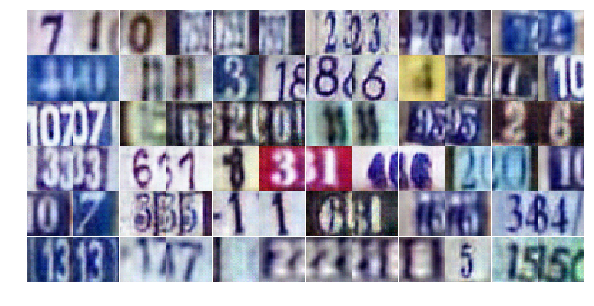

Epoch 10/10... Discriminator Loss: 1.2322... Generator reward Loss: 0.6814... Generator reconst Loss: 0.6732
Epoch 10/10... Discriminator Loss: 1.1548... Generator reward Loss: 0.9371... Generator reconst Loss: 0.6773
Epoch 10/10... Discriminator Loss: 0.8594... Generator reward Loss: 0.9555... Generator reconst Loss: 0.6734


In [29]:
dataset = Dataset(trainset, testset)

losses, samples = train(net=net, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

(573, 3) (573, 3) float32 float32


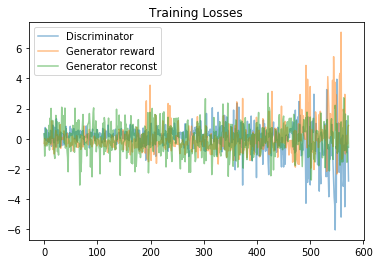

In [33]:
fig, ax = plt.subplots()
losses = np.array(losses)
losses_norm = (losses - losses.mean(axis=0))/losses.std(axis=0)
print(losses.shape, losses_norm.shape, losses_norm.dtype, losses_norm.dtype)
plt.plot(losses_norm.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Generator reward', alpha=0.5)
plt.plot(losses_norm.T[2], label='Generator reconst', alpha=0.5)
plt.title("Training Losses")
plt.legend()

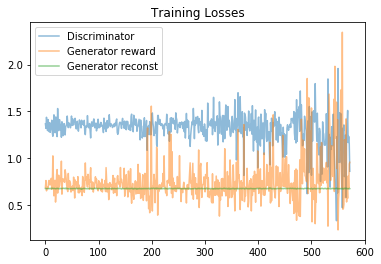

In [34]:
fig, ax = plt.subplots()
# losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator reward', alpha=0.5)
plt.plot(losses.T[2], label='Generator reconst', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


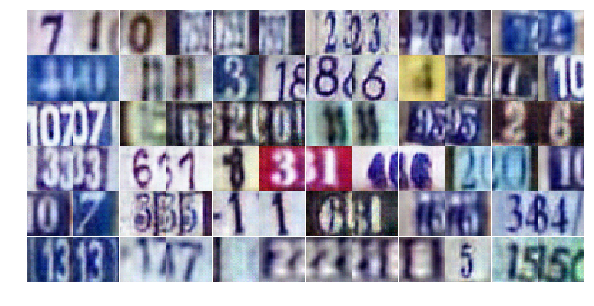

In [35]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

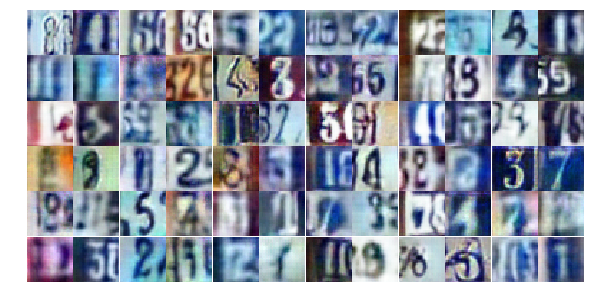

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))